# Importing Libraries:

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    """
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in an uniform grid.

    """
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

# Generator:

In [3]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels of the output image, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''

        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)
            )
        else: # Final Layer
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()
            )

    def unsqueeze_noise(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns a copy of that noise with width and height = 1 and channels = z_dim.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return noise.view(len(noise), self.z_dim, 1, 1)

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        x = self.unsqueeze_noise(noise)
        return self.gen(x)

def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim)
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    return torch.randn(n_samples, z_dim, device=device)

In [4]:
gen = Generator()
num_test = 100

# Test the hidden block
test_hidden_noise = get_noise(num_test, gen.z_dim)
test_hidden_block = gen.make_gen_block(10, 20, kernel_size=4, stride=1)
test_uns_noise = gen.unsqueeze_noise(test_hidden_noise)
hidden_output = test_hidden_block(test_uns_noise)

# Check that it works with other strides
test_hidden_block_stride = gen.make_gen_block(20, 20, kernel_size=4, stride=2)

test_final_noise = get_noise(num_test, gen.z_dim) * 20
test_final_block = gen.make_gen_block(10, 20, final_layer=True)
test_final_uns_noise = gen.unsqueeze_noise(test_final_noise)
final_output = test_final_block(test_final_uns_noise)

# Test the whole thing:
test_gen_noise = get_noise(num_test, gen.z_dim)
test_uns_gen_noise = gen.unsqueeze_noise(test_gen_noise)
gen_output = gen(test_uns_gen_noise)

In [5]:
try:
    assert tuple(hidden_output.shape) == (num_test, 20, 4, 4)
    assert hidden_output.max() > 1
    assert hidden_output.min() == 0
    assert hidden_output.std() > 0.2
    assert hidden_output.std() < 1 
    assert hidden_output.std() > 0.5

    assert tuple(test_hidden_block_stride(hidden_output).shape) == (num_test, 20, 10, 10)

    assert final_output.max().item() == 1
    assert final_output.min().item() == -1

    assert tuple(gen_output.shape) == (num_test, 1, 28, 28)
    assert gen_output.std() > 0.5
    assert gen_output.std() < 0.8
    print('Success!')

except: 
    print('Some of asserts have fail')

Success!


## Discriminator:

In [6]:
from typing import final


class Discriminator(nn.Module):
    """
    Discriminator class

    Args:
        im_chan: the number of channels of the outputs image
        hidden_dim: the inner dimension
    """
    def __init__(self, im_chan=1, hidden_dim=16):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            self.make_disc_block(im_chan, hidden_dim),
            self.make_disc_block(hidden_dim, hidden_dim * 2),
            self.make_disc_block(hidden_dim * 2, 1, final_layer=True),
        )
    def make_disc_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        """
        Function to return a sequence of operations corresponding to a discriminator block of DCGAN, 
        corresponding to a convolution, a batchnorm (except for in the last layer), and an activation.

        Args:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        """
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),
            )

        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        disc_pred = self.disc(image)
        return disc_pred.view(len(disc_pred), -1)

In [7]:
num_test = 100

gen = Generator()
disc = Discriminator()
test_images = gen(get_noise(num_test, gen.z_dim))

# Test the final block
test_hidden_block = disc.make_disc_block(1, 5, kernel_size=6, stride=3)
hidden_output = test_hidden_block(test_images)

# Test the final block
test_final_block = disc.make_disc_block(1, 10, kernel_size=2, stride=5, final_layer=True)
final_output = test_final_block(test_images)

# Test the whole thing:
disc_output = disc(test_images)

In [8]:
try:
    assert tuple(hidden_output.shape) == (num_test, 5, 8, 8)

    # Because of the LeakyReLU slope
    assert -hidden_output.min() / hidden_output.max() > 0.15
    assert -hidden_output.min() / hidden_output.max() < 0.25
    assert hidden_output.std() > 0.5
    assert hidden_output.std() < 1

    # Test the final block

    assert tuple(final_output.shape) == (num_test, 10, 6, 6)
    assert final_output.max() > 1.0
    assert final_output.min() < -1.0
    assert final_output.std() > 0.3
    assert final_output.std() < 0.6

    # Test the whole thing:

    assert tuple(disc_output.shape) == (num_test, 1)
    assert disc_output.std() > 0.25
    assert disc_output.std() < 0.5
    print('Success!')
except:
    print("Some of asserts have fail")

Success!


## Training: 

In [9]:
criterion = nn.BCEWithLogitsLoss()
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.0002
beta_1 = 0.5
beta_2 = 0.999
device = 'cuda'

# You can transform the image values to be between -1 and 1 
transform = transforms.Compose([transforms.ToTensor(),
transforms.Normalize((0.5,), (0.5,)),
])

dataloader = DataLoader(
    MNIST('.', download=True, transform=transform),
    batch_size=batch_size,
    shuffle=True
)

### Then we can initialize our generator, discriminator, and optimizers.

In [10]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr, betas=(beta_1, beta_2))

# We can initialize the weights to the normal distribution
# with the mean 0 and the standard deviation 0.02
def weights_init(m):
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)
gen = gen.apply(weights_init)
disc = disc.apply(weights_init)

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 0.9361314014196394, discriminator loss: 0.4966398511826987
Fake image


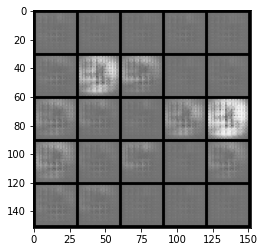

Real image


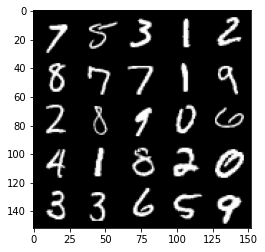

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 2.7411625165939353, discriminator loss: 0.3128969931304455
Fake image


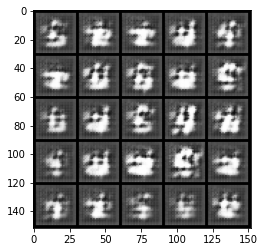

Real image


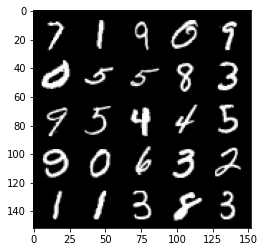

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 4.013877167314293, discriminator loss: 0.4870579515099525
Fake image


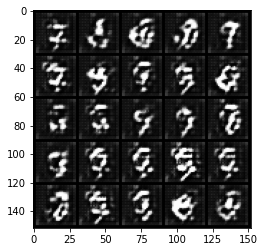

Real image


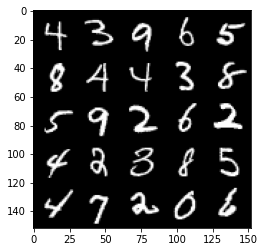

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 5.0020868959128935, discriminator loss: 0.5837268988490106
Fake image


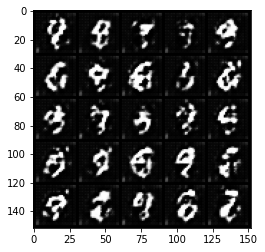

Real image


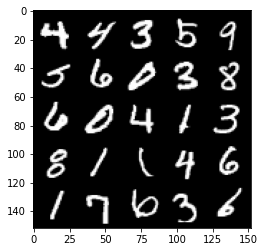

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 5.928174798876051, discriminator loss: 0.576323009252548
Fake image


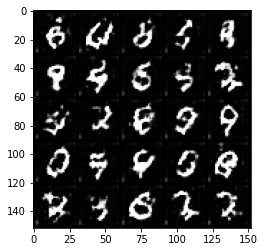

Real image


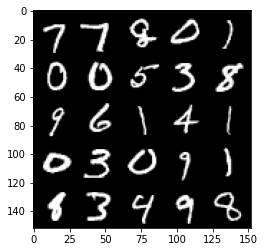

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 6.801799044281241, discriminator loss: 0.6145871609449384
Fake image


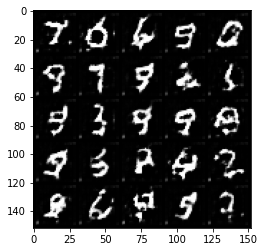

Real image


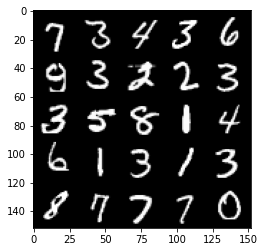

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 7.616033035904157, discriminator loss: 0.6390316276550295
Fake image


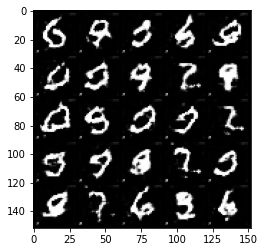

Real image


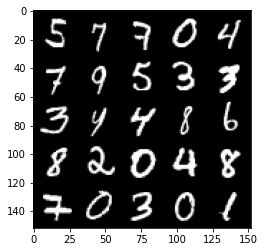

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 8.420582621008162, discriminator loss: 0.6469614365100861
Fake image


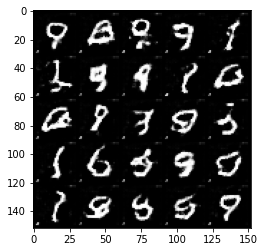

Real image


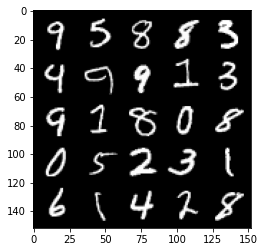

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 9.216439534157539, discriminator loss: 0.6549732319116596
Fake image


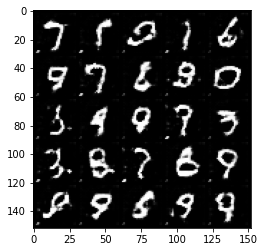

Real image


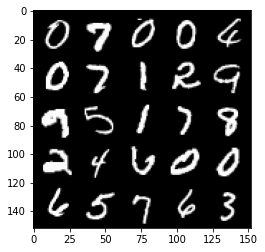

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 10.000425834268365, discriminator loss: 0.6580526555776589
Fake image


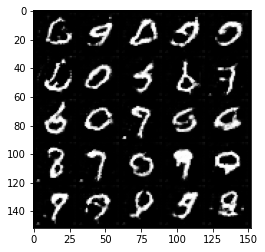

Real image


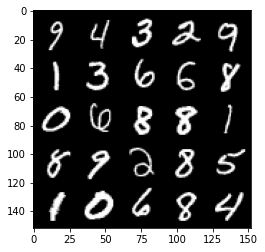

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 10.78169278678301, discriminator loss: 0.6668063429594036
Fake image


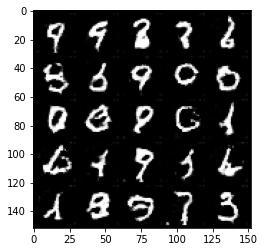

Real image


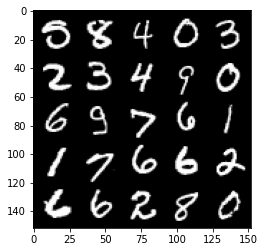

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 11.552175354450975, discriminator loss: 0.670068000197411
Fake image


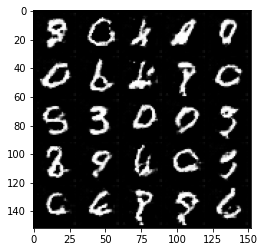

Real image


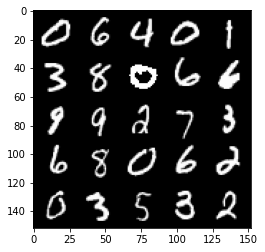

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 12.316414718061717, discriminator loss: 0.6745169378519065
Fake image


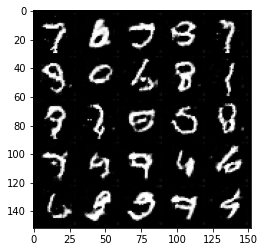

Real image


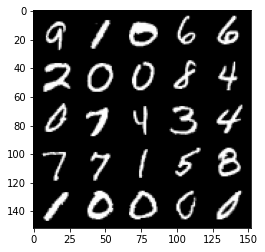

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 13.074240484327103, discriminator loss: 0.6779364223480223
Fake image


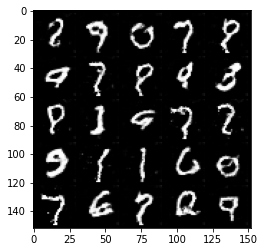

Real image


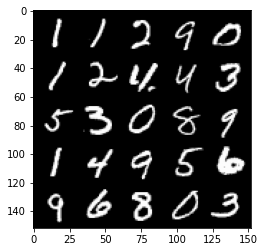

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 13.829229629248424, discriminator loss: 0.6811478663682939
Fake image


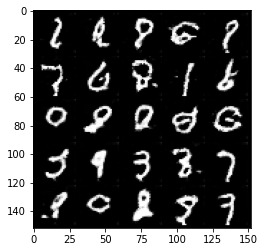

Real image


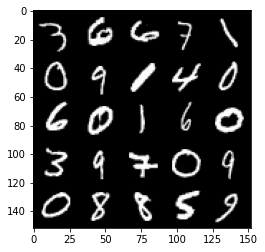

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 14.574277140885625, discriminator loss: 0.6817869778871533
Fake image


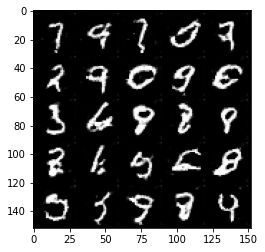

Real image


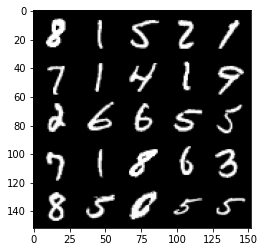

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 15.312020421117593, discriminator loss: 0.6845464793443675
Fake image


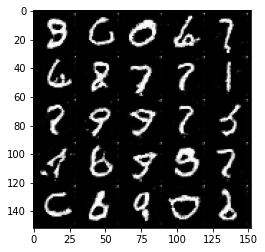

Real image


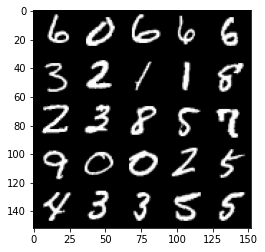

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 16.050280872732454, discriminator loss: 0.6885014909505849
Fake image


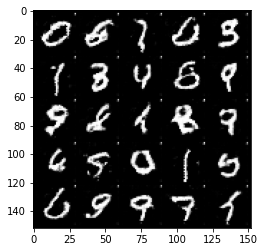

Real image


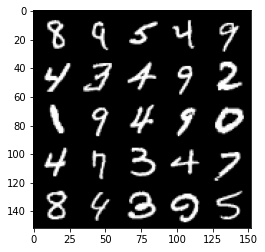

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 16.78136772212391, discriminator loss: 0.6882104575634005
Fake image


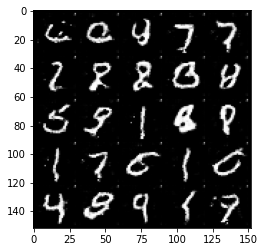

Real image


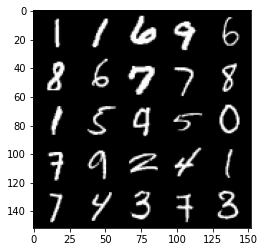

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 17.512830971628457, discriminator loss: 0.6902083792686468
Fake image


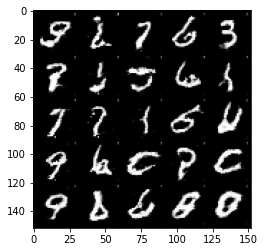

Real image


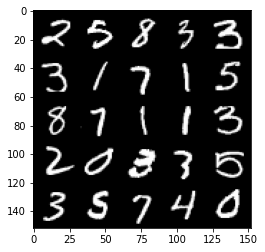

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 18.240473434895346, discriminator loss: 0.6913049489259724
Fake image


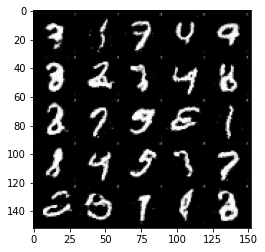

Real image


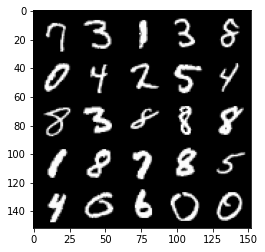

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 18.967167313009575, discriminator loss: 0.6938196749687192
Fake image


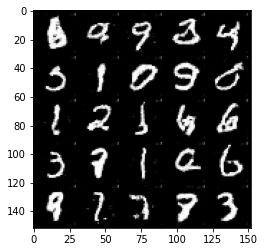

Real image


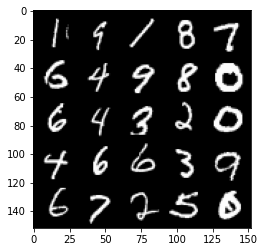

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 19.688768062919436, discriminator loss: 0.6931705574989317
Fake image


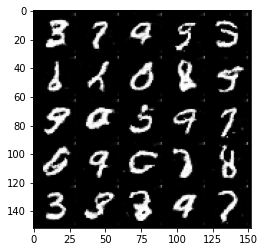

Real image


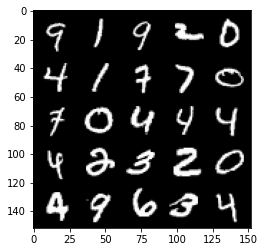

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 20.41109399989254, discriminator loss: 0.6926164599657063
Fake image


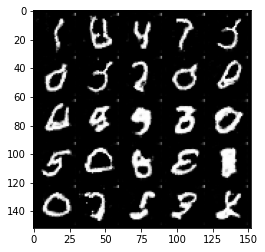

Real image


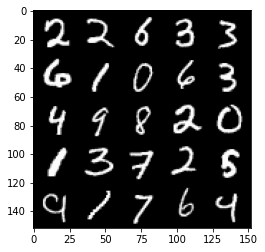

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 21.129739474147648, discriminator loss: 0.6942078351974489
Fake image


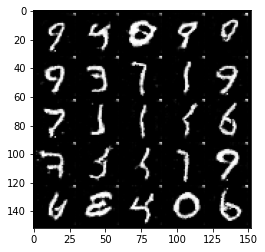

Real image


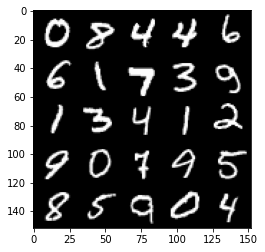

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 21.845940739661557, discriminator loss: 0.6945617240667338
Fake image


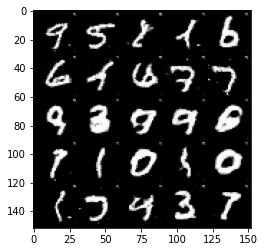

Real image


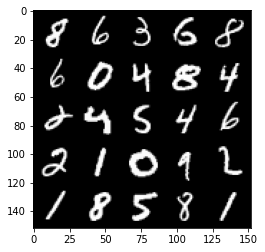

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 22.559932284504285, discriminator loss: 0.6953412847518922
Fake image


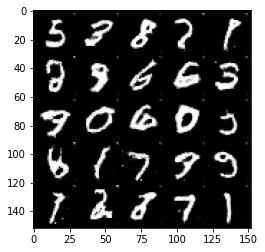

Real image


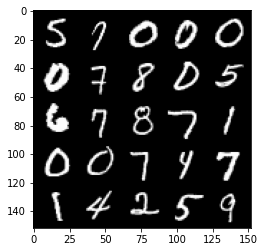

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 23.271843411415873, discriminator loss: 0.6957925090789793
Fake image


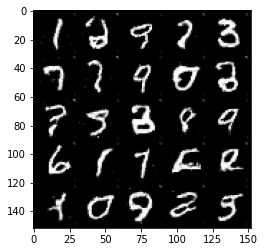

Real image


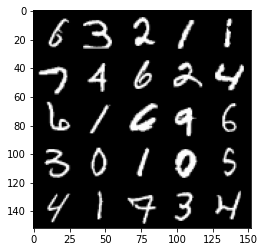

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 23.985417012006064, discriminator loss: 0.695482813358307
Fake image


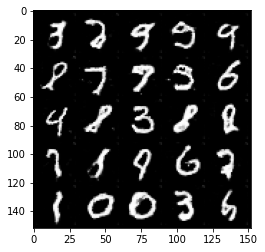

Real image


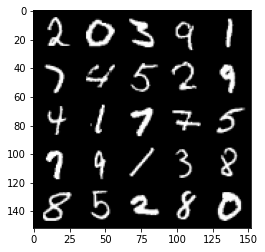

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 24.696568582981843, discriminator loss: 0.6954181374311451
Fake image


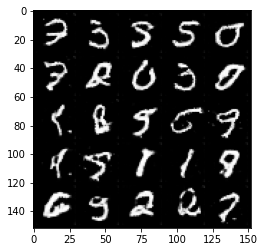

Real image


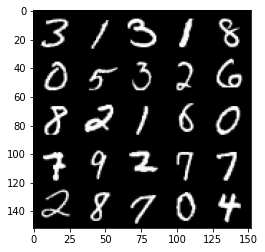

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 25.405648037463447, discriminator loss: 0.6953496462106705
Fake image


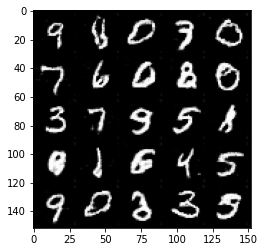

Real image


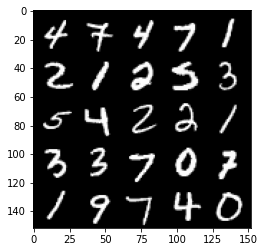

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 26.112690301805788, discriminator loss: 0.6951945207118992
Fake image


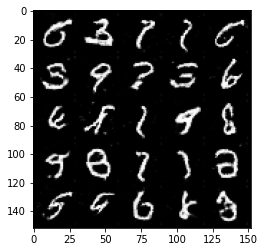

Real image


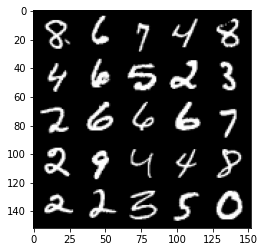

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 26.818206016570382, discriminator loss: 0.6962368843555449
Fake image


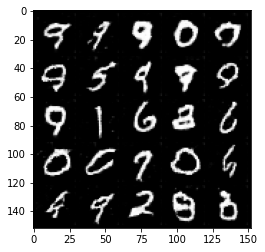

Real image


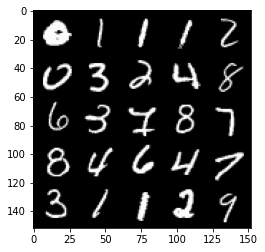

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 27.521520243793766, discriminator loss: 0.6959737539291383
Fake image


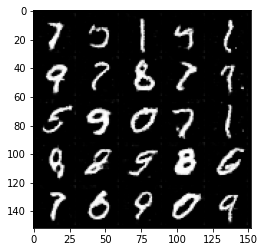

Real image


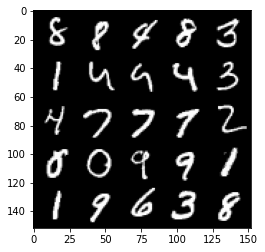

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 28.22572456666834, discriminator loss: 0.6968902015686039
Fake image


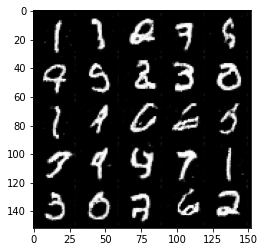

Real image


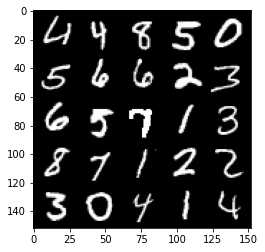

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 28.927841369718372, discriminator loss: 0.6969766776561731
Fake image


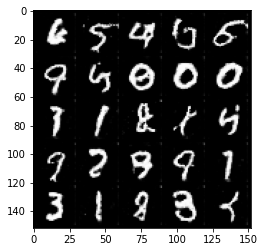

Real image


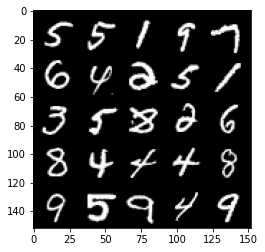

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 29.62944288143523, discriminator loss: 0.696695346593856
Fake image


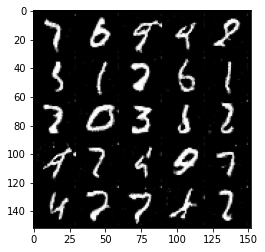

Real image


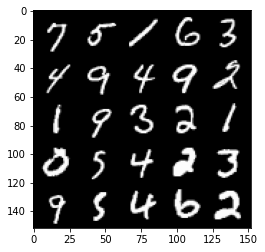

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 30.3312761265934, discriminator loss: 0.6975636239051818
Fake image


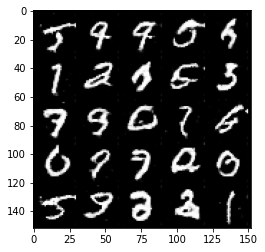

Real image


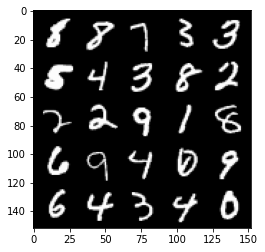

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 31.03348918625718, discriminator loss: 0.69651080262661
Fake image


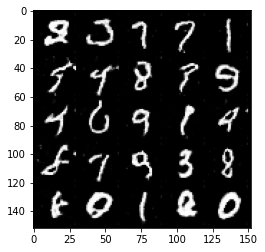

Real image


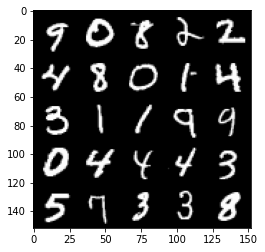

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 31.733593661159333, discriminator loss: 0.6969616714715955
Fake image


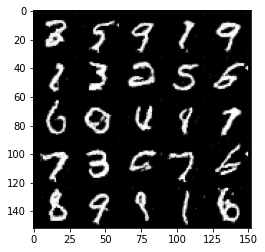

Real image


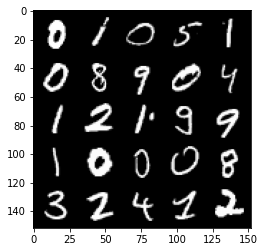

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 32.43292434856294, discriminator loss: 0.6967530237436297
Fake image


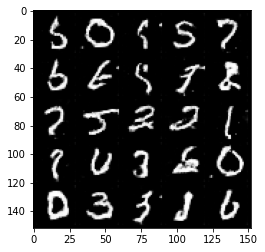

Real image


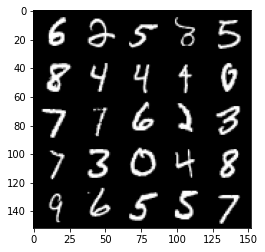

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 33.13211052820085, discriminator loss: 0.69673649573326
Fake image


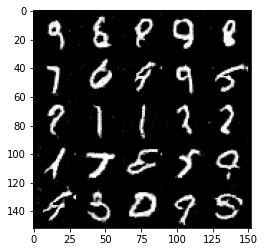

Real image


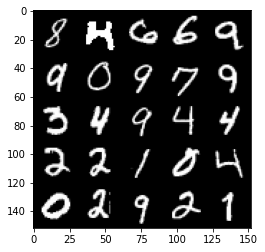

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 33.83077414450041, discriminator loss: 0.6966715172529223
Fake image


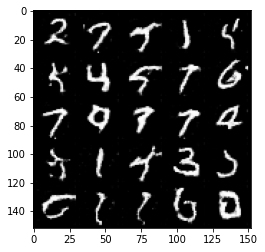

Real image


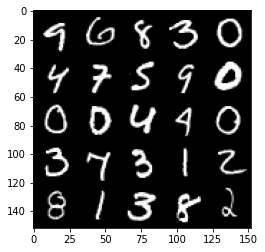

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 34.52786840292797, discriminator loss: 0.696285172224044
Fake image


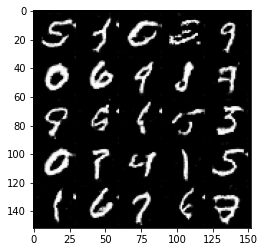

Real image


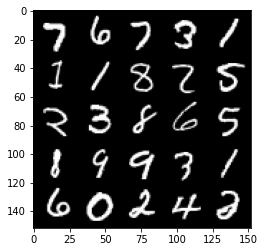

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 35.225960181683114, discriminator loss: 0.6961354687213906
Fake image


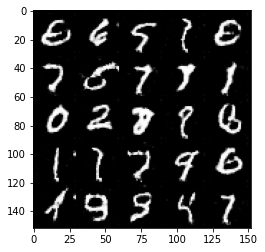

Real image


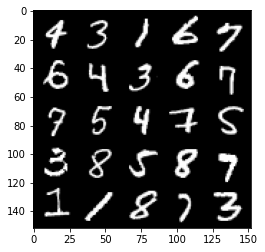

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 35.92466051718568, discriminator loss: 0.6960480554103858
Fake image


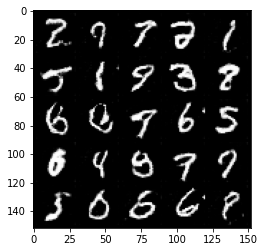

Real image


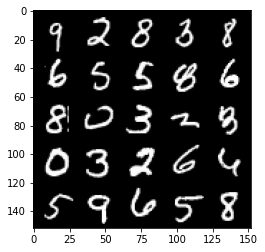

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 36.6217890350518, discriminator loss: 0.6957061760425578
Fake image


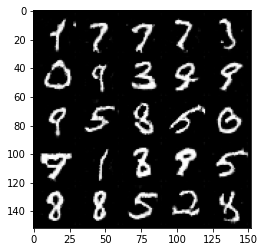

Real image


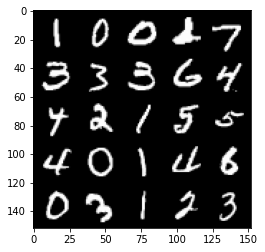

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 37.3186455049215, discriminator loss: 0.6955266457796087
Fake image


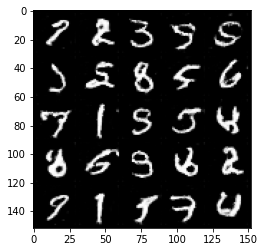

Real image


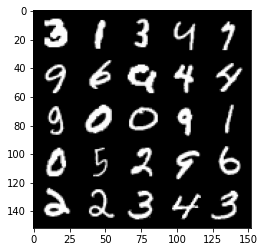

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 38.015734665602196, discriminator loss: 0.6953938241004943
Fake image


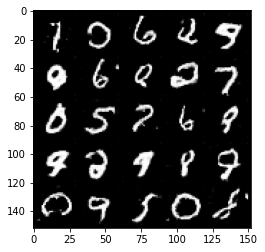

Real image


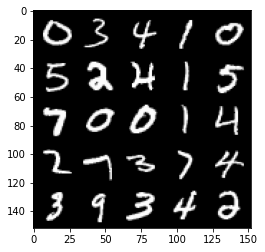

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 38.711862161606284, discriminator loss: 0.6953237711191184
Fake image


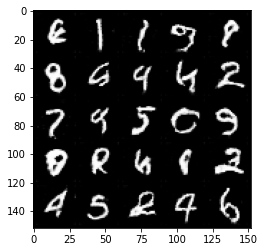

Real image


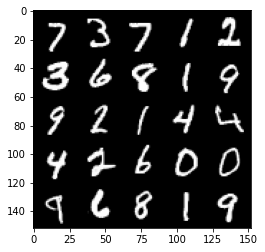

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 39.40847413656086, discriminator loss: 0.6955091626644129
Fake image


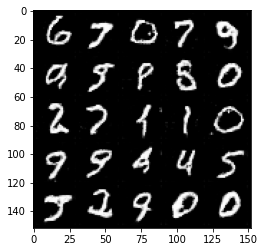

Real image


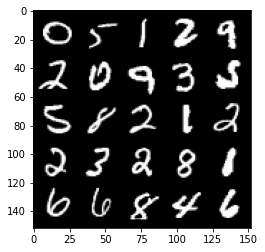

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 40.10605406984656, discriminator loss: 0.694977606534958
Fake image


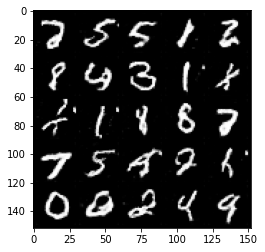

Real image


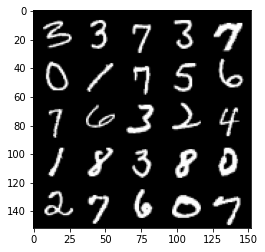

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 40.80366465780113, discriminator loss: 0.6949958170652388
Fake image


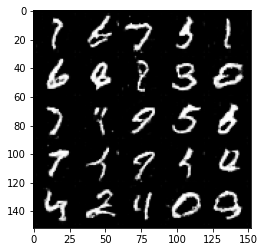

Real image


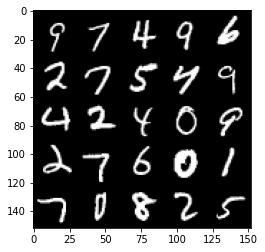

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 41.500790090054075, discriminator loss: 0.6949377170801162
Fake image


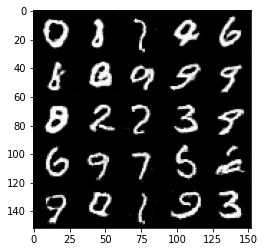

Real image


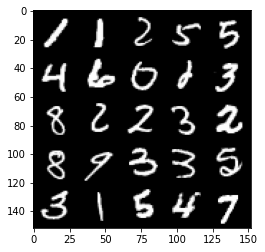

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 42.196562964647846, discriminator loss: 0.6946709241867061
Fake image


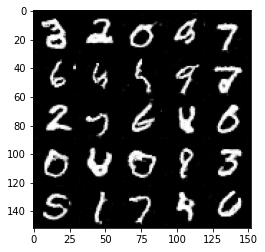

Real image


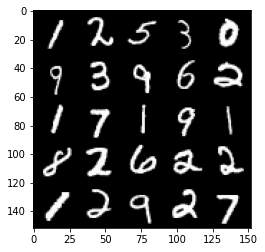

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 42.895033997148126, discriminator loss: 0.6948916782140727
Fake image


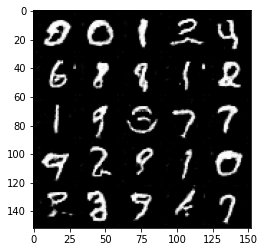

Real image


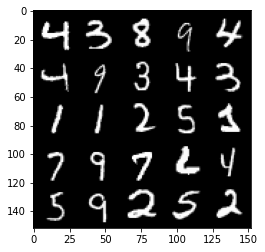

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 43.591046496719066, discriminator loss: 0.69452246427536
Fake image


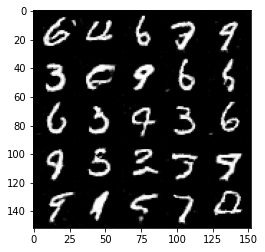

Real image


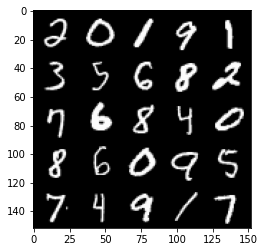

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 44.28662155756343, discriminator loss: 0.6945492101907728
Fake image


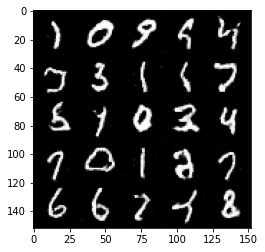

Real image


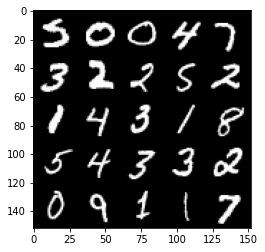

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 44.98324238893376, discriminator loss: 0.6945612208843226
Fake image


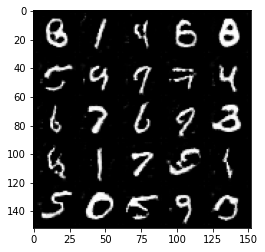

Real image


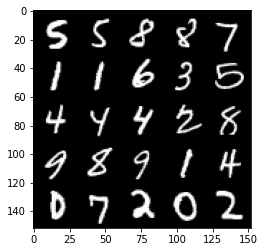

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 45.67922354206438, discriminator loss: 0.6944573432207104
Fake image


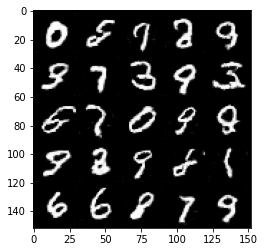

Real image


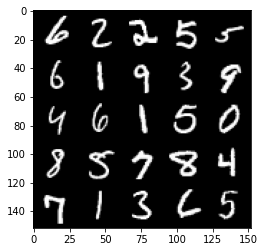

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 46.37476718732702, discriminator loss: 0.6942780088186263
Fake image


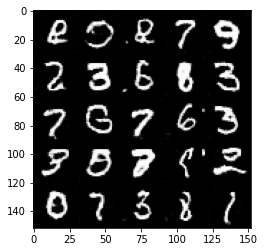

Real image


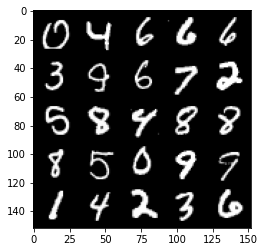

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 47.07146150025708, discriminator loss: 0.6942195659875864
Fake image


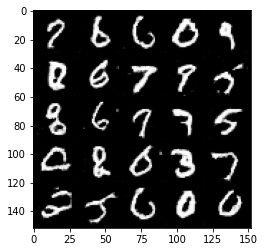

Real image


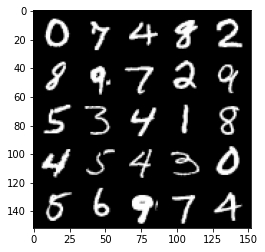

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 47.767420027345295, discriminator loss: 0.6942174944877626
Fake image


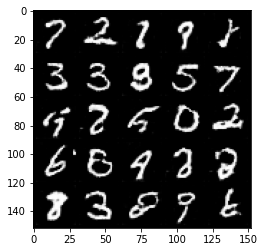

Real image


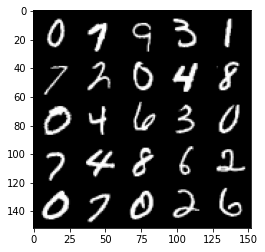

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 48.463354410499164, discriminator loss: 0.6941317102909085
Fake image


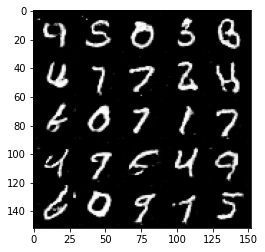

Real image


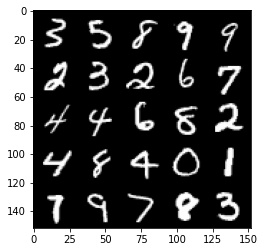

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 49.15888596090661, discriminator loss: 0.694076427698135
Fake image


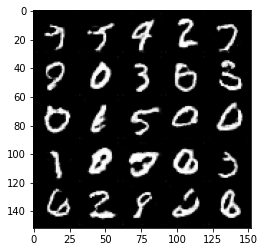

Real image


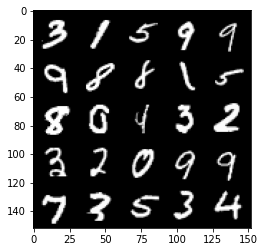

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 49.855091536968764, discriminator loss: 0.6941657499074939
Fake image


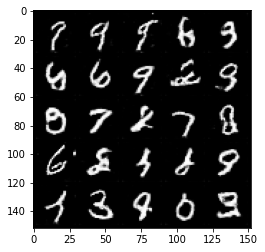

Real image


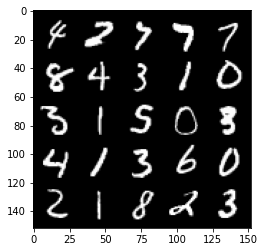

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 50.55085215362884, discriminator loss: 0.694002692937851
Fake image


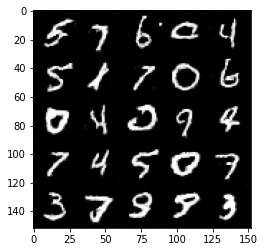

Real image


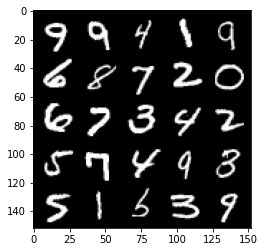

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 51.24621451696736, discriminator loss: 0.69405437028408
Fake image


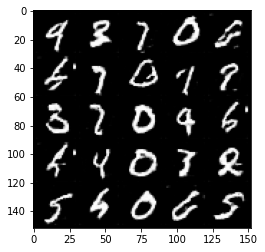

Real image


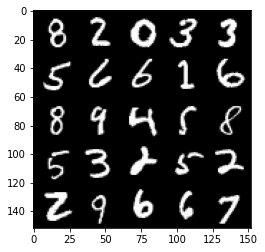

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 51.94196294364322, discriminator loss: 0.6939948675632478
Fake image


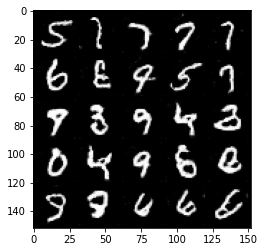

Real image


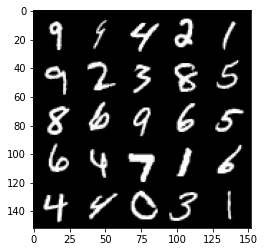

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 52.636515346616385, discriminator loss: 0.6938472661972042
Fake image


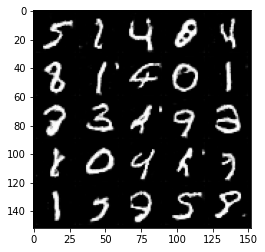

Real image


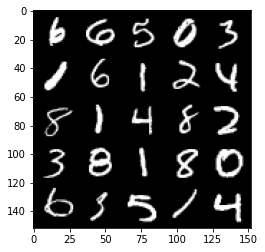

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 53.33313554212434, discriminator loss: 0.69406721520424
Fake image


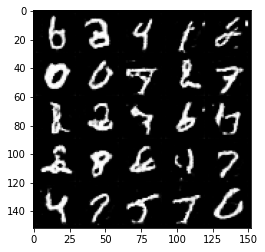

Real image


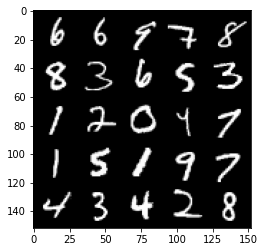

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 54.02783782693729, discriminator loss: 0.6938802736997601
Fake image


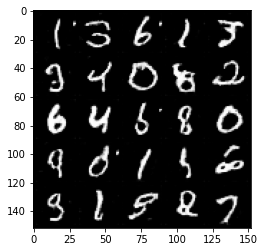

Real image


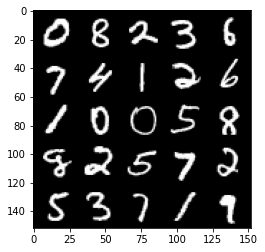

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 54.72243672248717, discriminator loss: 0.693814603686333
Fake image


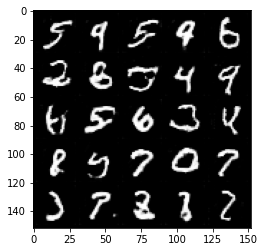

Real image


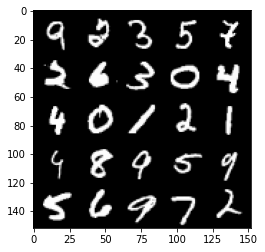

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 55.41743810686464, discriminator loss: 0.6938874890804286
Fake image


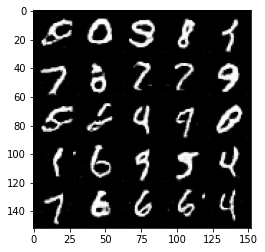

Real image


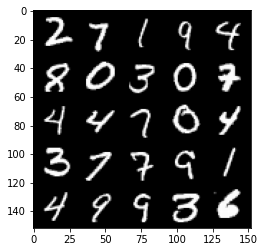

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 56.112087706178315, discriminator loss: 0.694007749557495
Fake image


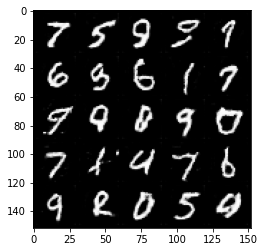

Real image


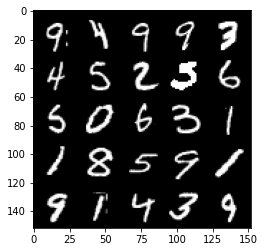

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 56.80718850836132, discriminator loss: 0.6937572722434996
Fake image


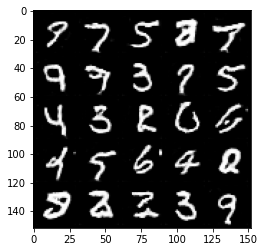

Real image


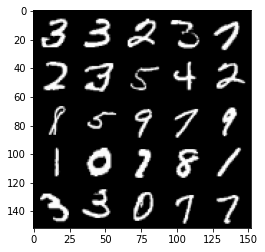

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 57.502490439623394, discriminator loss: 0.6937121738195416
Fake image


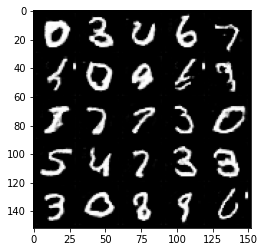

Real image


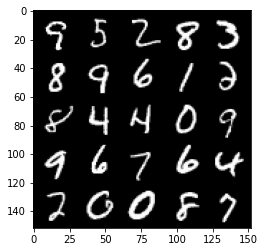

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 58.197304791062884, discriminator loss: 0.6938796350955966
Fake image


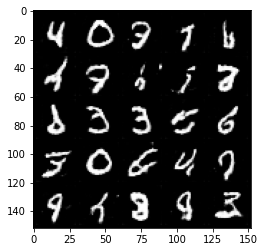

Real image


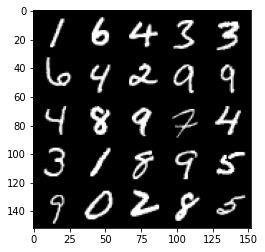

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 58.8930392088591, discriminator loss: 0.6937965871095658
Fake image


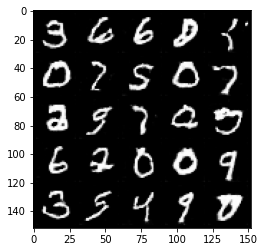

Real image


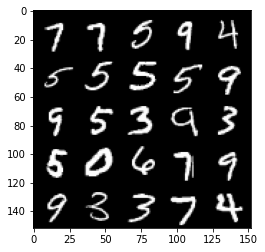

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 59.58774588271956, discriminator loss: 0.6936642804145815
Fake image


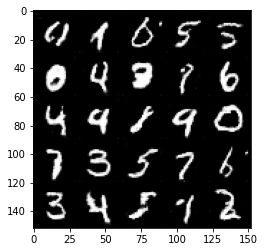

Real image


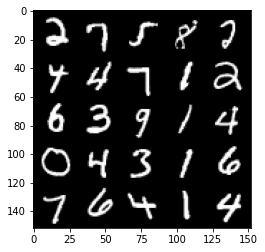

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 60.282534308761065, discriminator loss: 0.6935817526578907
Fake image


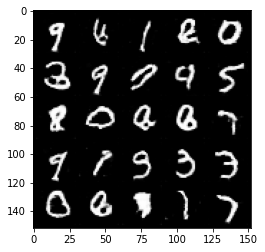

Real image


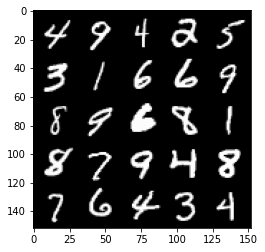

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 60.97700488719316, discriminator loss: 0.6936408691406248
Fake image


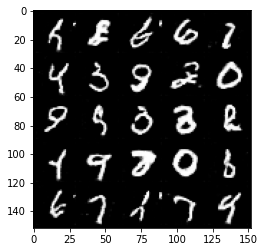

Real image


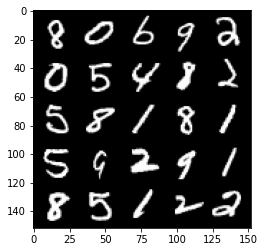

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 61.672154404490946, discriminator loss: 0.693714005112648
Fake image


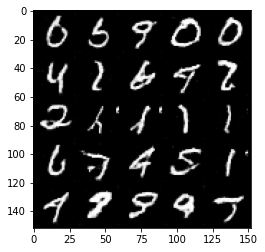

Real image


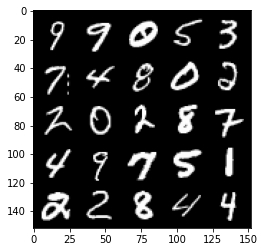

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 62.36615310820918, discriminator loss: 0.6936097863912578
Fake image


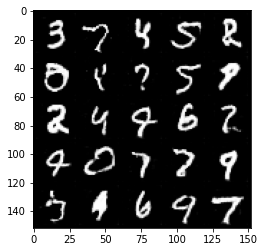

Real image


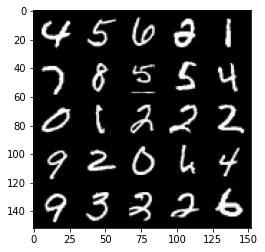

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 63.06105092796656, discriminator loss: 0.6936221883296967
Fake image


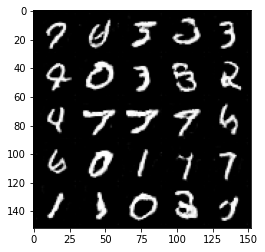

Real image


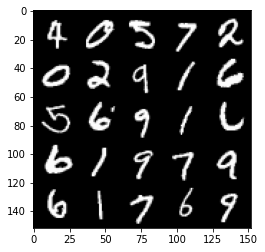

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 63.7558810109791, discriminator loss: 0.6935885924100874
Fake image


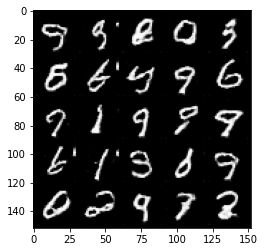

Real image


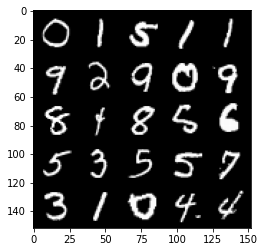

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 64.45035607203805, discriminator loss: 0.6935923862457272
Fake image


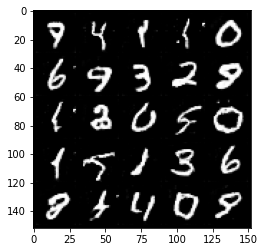

Real image


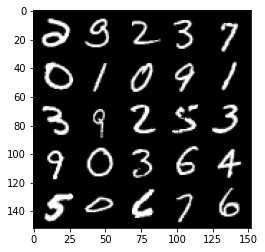

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 65.14443237325506, discriminator loss: 0.6935512903928762
Fake image


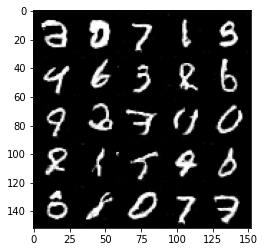

Real image


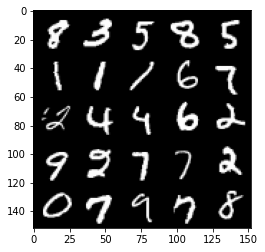

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 65.83915130409572, discriminator loss: 0.693581897497177
Fake image


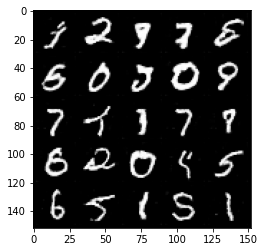

Real image


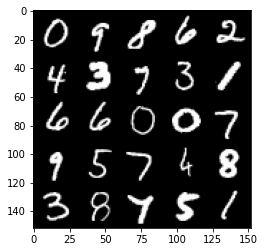

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 66.53369991537903, discriminator loss: 0.6936279777288439
Fake image


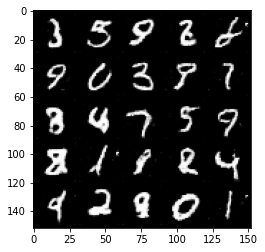

Real image


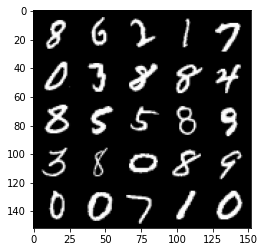

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 67.22779322752339, discriminator loss: 0.6935352644920342
Fake image


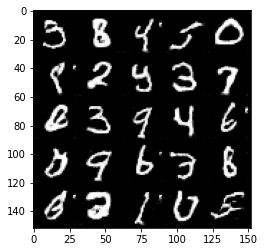

Real image


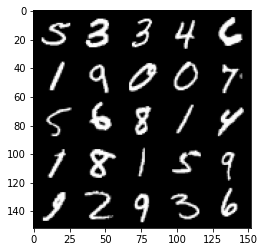

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 67.92243904957154, discriminator loss: 0.693549034595489
Fake image


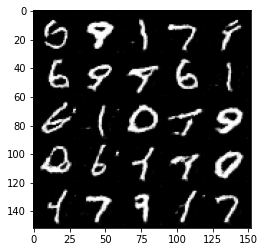

Real image


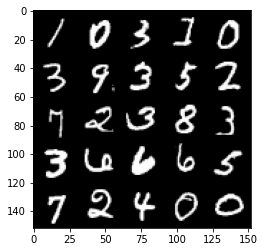

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 68.61729028281546, discriminator loss: 0.6936760970354079
Fake image


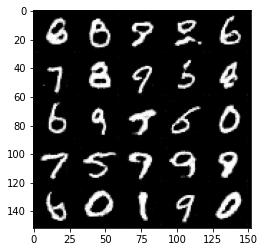

Real image


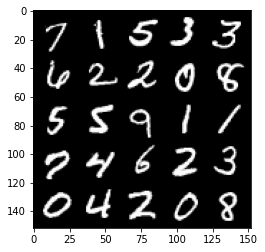

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47000: Generator loss: 69.31193373963217, discriminator loss: 0.6934322128295898
Fake image


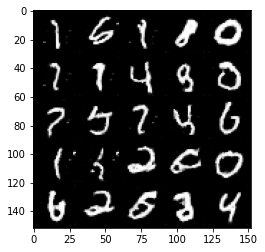

Real image


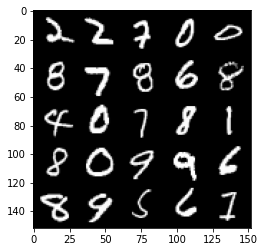

  0%|          | 0/469 [00:00<?, ?it/s]

Step 47500: Generator loss: 70.00582848617418, discriminator loss: 0.6935578794479372
Fake image


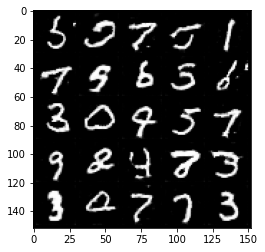

Real image


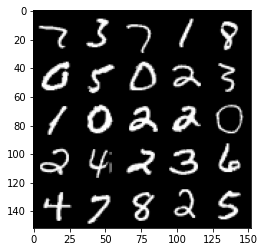

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48000: Generator loss: 70.70047336754183, discriminator loss: 0.6935529160499571
Fake image


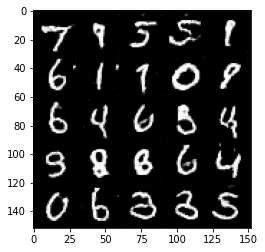

Real image


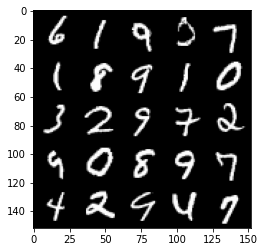

  0%|          | 0/469 [00:00<?, ?it/s]

Step 48500: Generator loss: 71.39487454923965, discriminator loss: 0.6934681627750401
Fake image


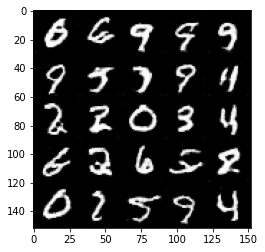

Real image


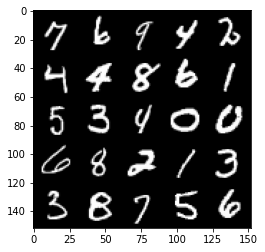

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49000: Generator loss: 72.08932172939149, discriminator loss: 0.6935112845897679
Fake image


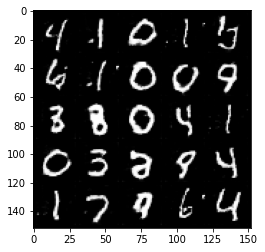

Real image


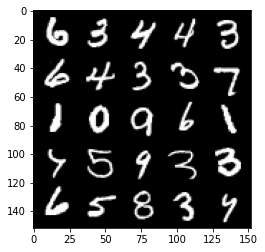

  0%|          | 0/469 [00:00<?, ?it/s]

Step 49500: Generator loss: 72.78340714833129, discriminator loss: 0.6934963965415949
Fake image


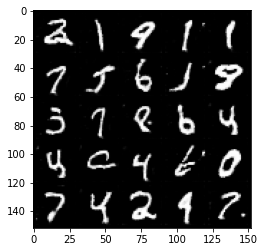

Real image


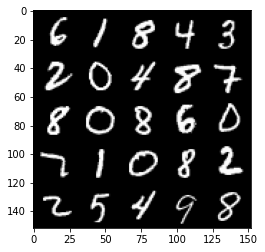

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50000: Generator loss: 73.47777791091781, discriminator loss: 0.6934097157716755
Fake image


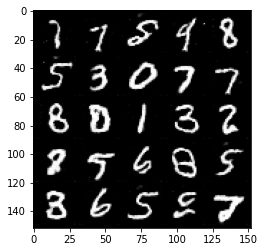

Real image


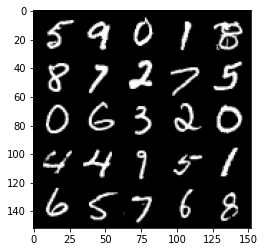

  0%|          | 0/469 [00:00<?, ?it/s]

Step 50500: Generator loss: 74.17217660209533, discriminator loss: 0.6934985362291334
Fake image


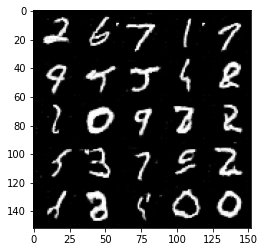

Real image


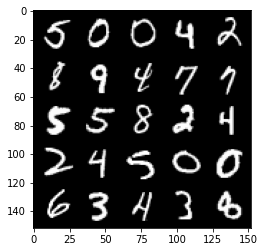

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51000: Generator loss: 74.86655756375191, discriminator loss: 0.6935947418212903
Fake image


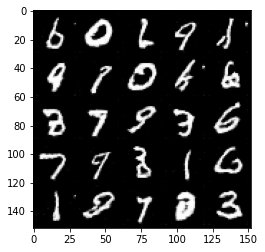

Real image


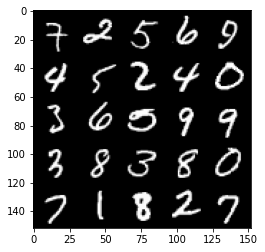

  0%|          | 0/469 [00:00<?, ?it/s]

Step 51500: Generator loss: 75.56047842368491, discriminator loss: 0.6935906311273572
Fake image


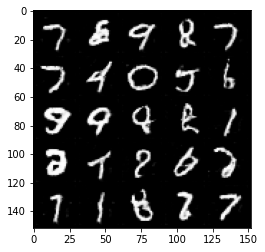

Real image


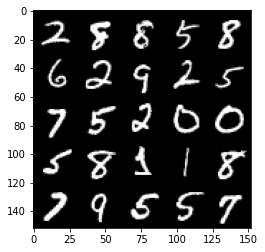

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52000: Generator loss: 76.25455825313944, discriminator loss: 0.6934687416553504
Fake image


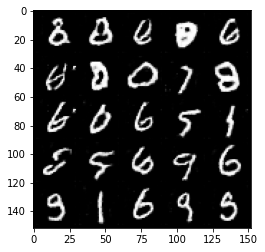

Real image


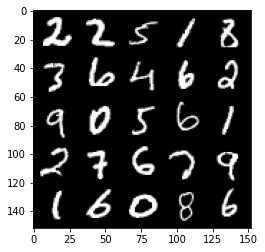

  0%|          | 0/469 [00:00<?, ?it/s]

Step 52500: Generator loss: 76.94830313929926, discriminator loss: 0.6934932874441152
Fake image


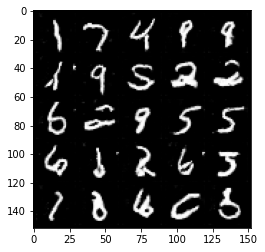

Real image


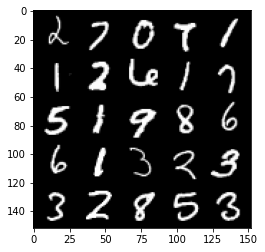

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53000: Generator loss: 77.64264460846798, discriminator loss: 0.6934696784019465
Fake image


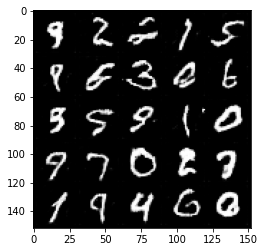

Real image


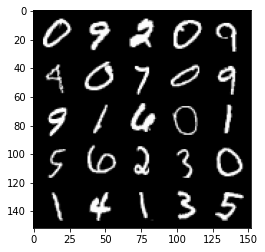

  0%|          | 0/469 [00:00<?, ?it/s]

Step 53500: Generator loss: 78.33661055192374, discriminator loss: 0.6935014684200296
Fake image


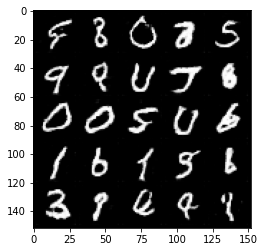

Real image


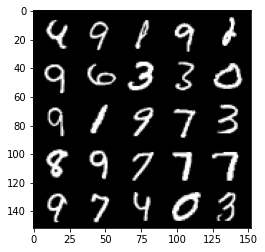

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54000: Generator loss: 79.03104806873222, discriminator loss: 0.6934708952903752
Fake image


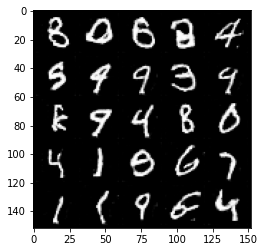

Real image


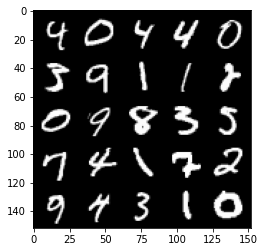

  0%|          | 0/469 [00:00<?, ?it/s]

Step 54500: Generator loss: 79.72492483028778, discriminator loss: 0.6934728711843494
Fake image


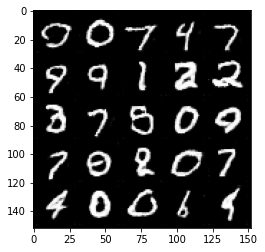

Real image


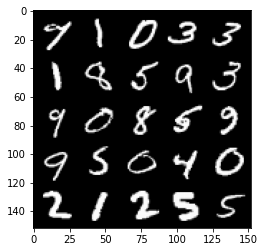

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55000: Generator loss: 80.41900066849607, discriminator loss: 0.6934324734210966
Fake image


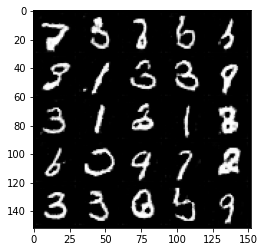

Real image


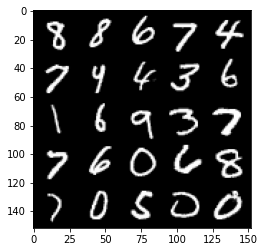

  0%|          | 0/469 [00:00<?, ?it/s]

Step 55500: Generator loss: 81.11287669000045, discriminator loss: 0.6934088189601895
Fake image


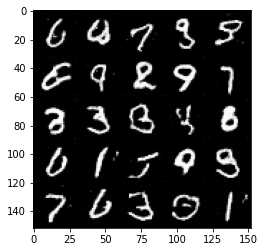

Real image


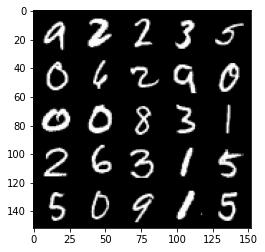

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56000: Generator loss: 81.80731418702014, discriminator loss: 0.6934247434139243
Fake image


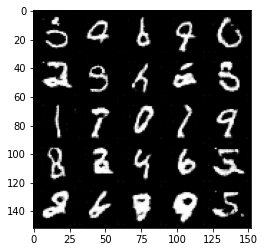

Real image


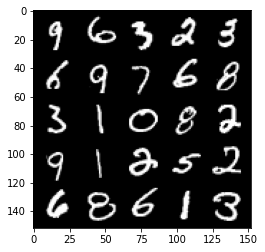

  0%|          | 0/469 [00:00<?, ?it/s]

Step 56500: Generator loss: 82.50089529356389, discriminator loss: 0.6933534966707223
Fake image


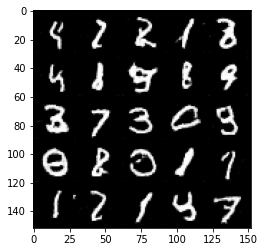

Real image


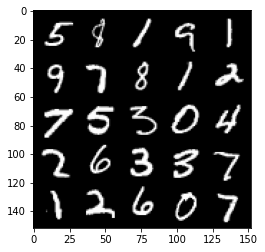

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57000: Generator loss: 83.19492520138644, discriminator loss: 0.6934310356378551
Fake image


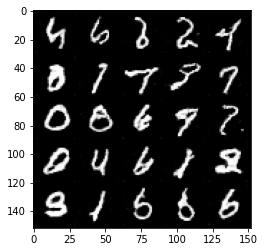

Real image


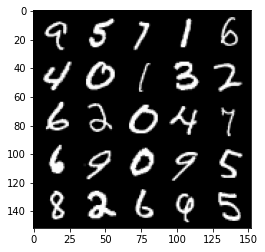

  0%|          | 0/469 [00:00<?, ?it/s]

Step 57500: Generator loss: 83.88884884104147, discriminator loss: 0.6933970046043396
Fake image


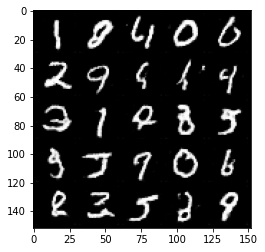

Real image


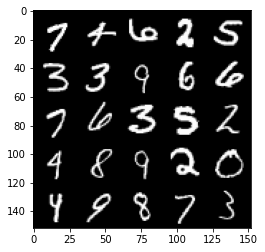

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58000: Generator loss: 84.58230628392107, discriminator loss: 0.6933930454254144
Fake image


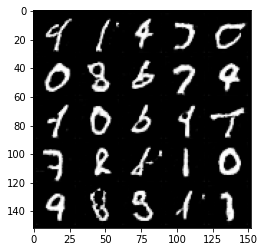

Real image


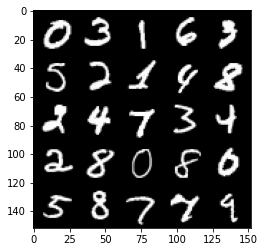

  0%|          | 0/469 [00:00<?, ?it/s]

Step 58500: Generator loss: 85.27618729612237, discriminator loss: 0.6934319757223137
Fake image


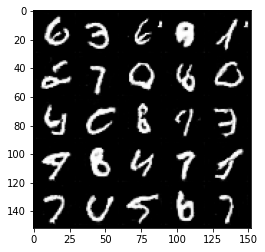

Real image


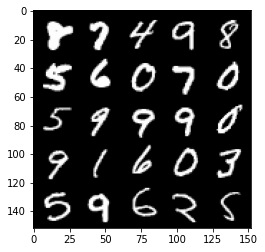

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59000: Generator loss: 85.97004486104834, discriminator loss: 0.6934147239923473
Fake image


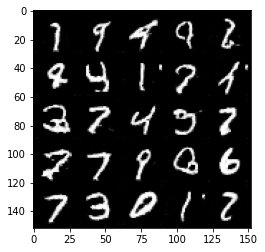

Real image


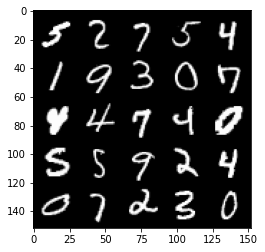

  0%|          | 0/469 [00:00<?, ?it/s]

Step 59500: Generator loss: 86.66401337096079, discriminator loss: 0.6933694839477546
Fake image


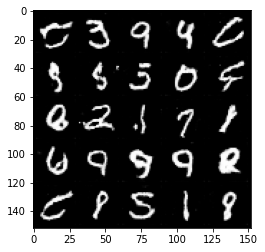

Real image


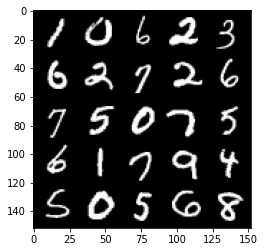

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60000: Generator loss: 87.35740843006938, discriminator loss: 0.6934661524295813
Fake image


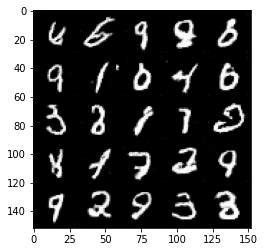

Real image


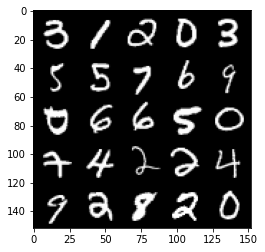

  0%|          | 0/469 [00:00<?, ?it/s]

Step 60500: Generator loss: 88.05117502006844, discriminator loss: 0.6933684275150299
Fake image


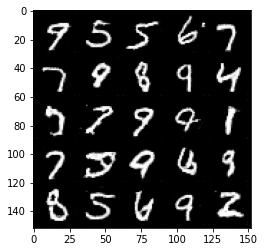

Real image


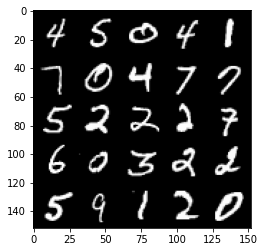

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61000: Generator loss: 88.74486734947511, discriminator loss: 0.6933724124431612
Fake image


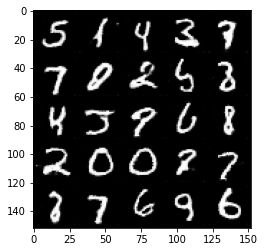

Real image


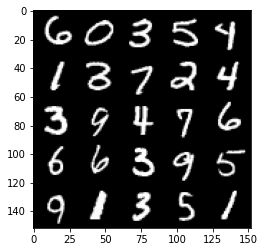

  0%|          | 0/469 [00:00<?, ?it/s]

Step 61500: Generator loss: 89.4386931355887, discriminator loss: 0.693470940828324
Fake image


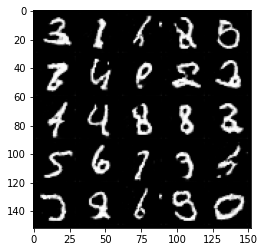

Real image


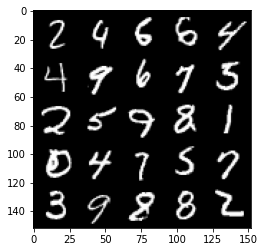

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62000: Generator loss: 90.13221912297523, discriminator loss: 0.6934005875587459
Fake image


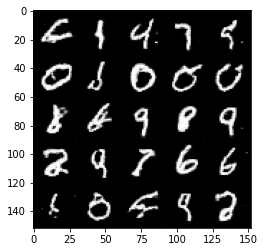

Real image


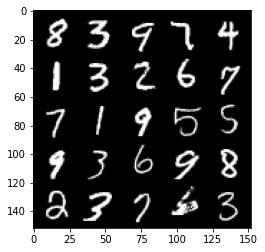

  0%|          | 0/469 [00:00<?, ?it/s]

Step 62500: Generator loss: 90.82589901015102, discriminator loss: 0.6934087885618202
Fake image


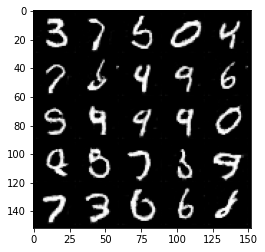

Real image


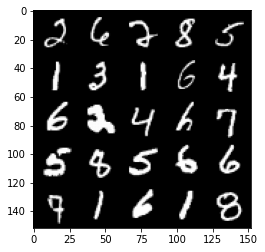

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63000: Generator loss: 91.51961153301536, discriminator loss: 0.6933475149869919
Fake image


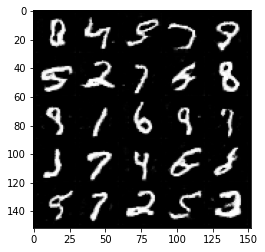

Real image


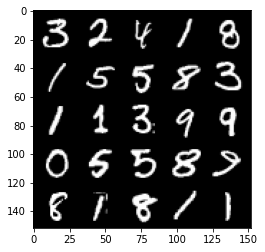

  0%|          | 0/469 [00:00<?, ?it/s]

Step 63500: Generator loss: 92.21315725359274, discriminator loss: 0.6934471971988687
Fake image


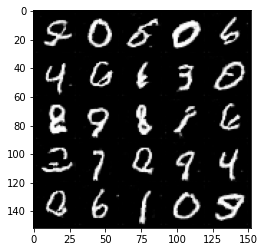

Real image


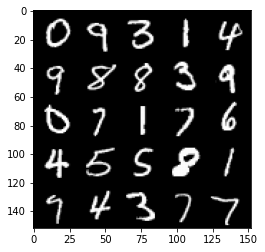

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64000: Generator loss: 92.90652139469952, discriminator loss: 0.6933949180841446
Fake image


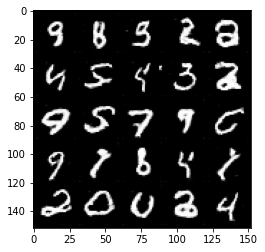

Real image


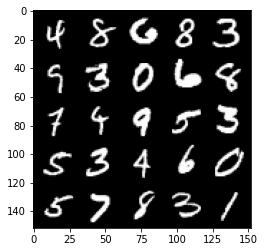

  0%|          | 0/469 [00:00<?, ?it/s]

Step 64500: Generator loss: 93.60017292091204, discriminator loss: 0.6933550493717194
Fake image


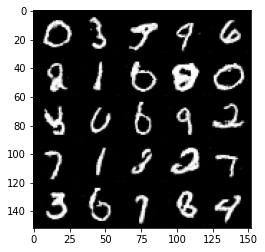

Real image


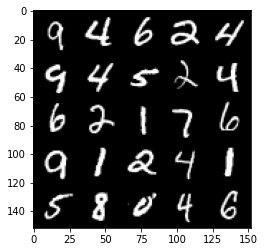

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65000: Generator loss: 94.29413533446144, discriminator loss: 0.6933875744342809
Fake image


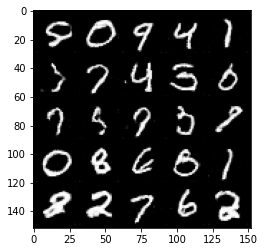

Real image


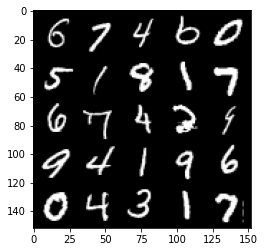

  0%|          | 0/469 [00:00<?, ?it/s]

Step 65500: Generator loss: 94.98754693743527, discriminator loss: 0.693401768565178
Fake image


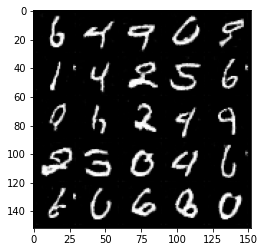

Real image


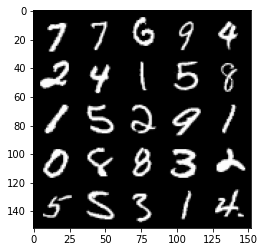

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66000: Generator loss: 95.68146027383155, discriminator loss: 0.6933674782514574
Fake image


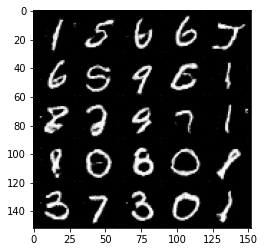

Real image


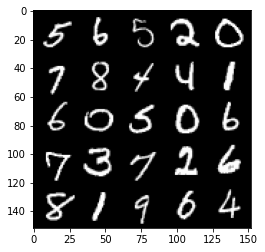

  0%|          | 0/469 [00:00<?, ?it/s]

Step 66500: Generator loss: 96.37502598771393, discriminator loss: 0.6933361020088195
Fake image


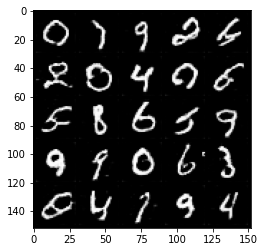

Real image


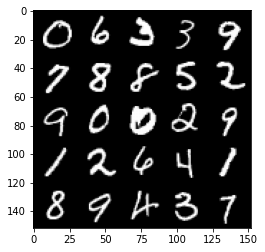

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67000: Generator loss: 97.06832364711096, discriminator loss: 0.6933756806850435
Fake image


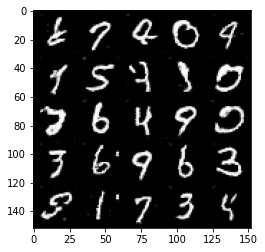

Real image


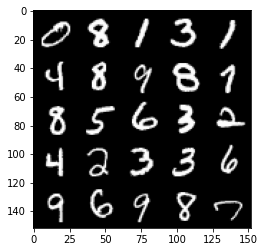

  0%|          | 0/469 [00:00<?, ?it/s]

Step 67500: Generator loss: 97.76181629428194, discriminator loss: 0.693364068388939
Fake image


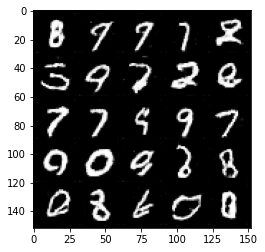

Real image


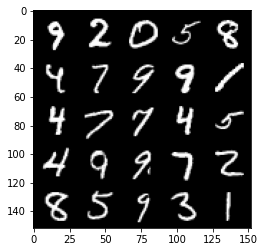

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68000: Generator loss: 98.45566043469242, discriminator loss: 0.6933469483852395
Fake image


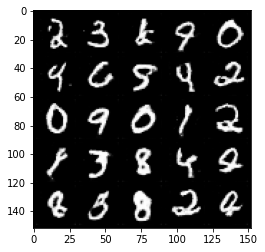

Real image


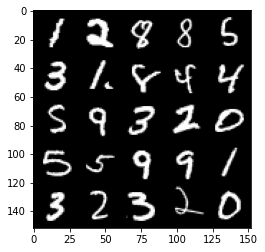

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 68500: Generator loss: 99.14947907242113, discriminator loss: 0.6933097580671306
Fake image


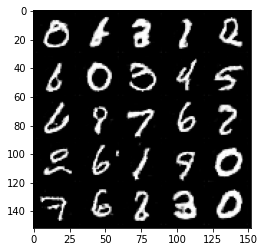

Real image


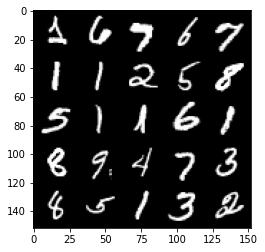

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69000: Generator loss: 99.84290140148923, discriminator loss: 0.6934593168497084
Fake image


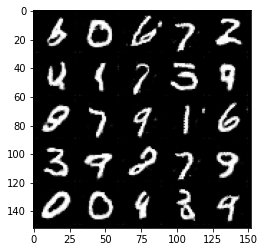

Real image


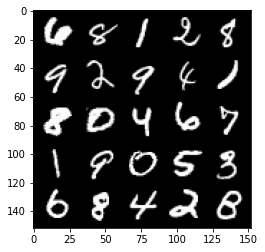

  0%|          | 0/469 [00:00<?, ?it/s]

Step 69500: Generator loss: 100.53633211764614, discriminator loss: 0.693425382494926
Fake image


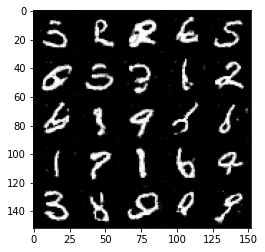

Real image


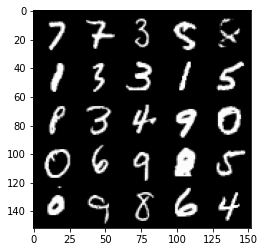

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70000: Generator loss: 101.22975935885223, discriminator loss: 0.6933517003059387
Fake image


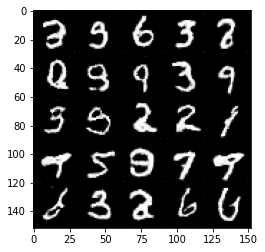

Real image


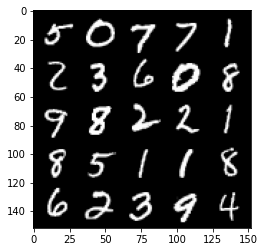

  0%|          | 0/469 [00:00<?, ?it/s]

Step 70500: Generator loss: 101.92288063308507, discriminator loss: 0.6933576477766054
Fake image


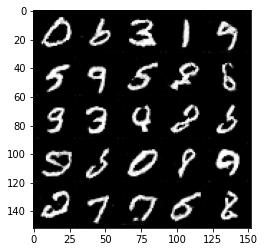

Real image


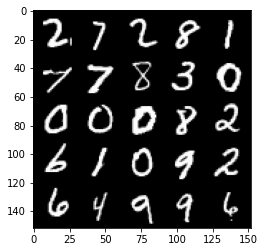

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71000: Generator loss: 102.61660400006083, discriminator loss: 0.6933936078548426
Fake image


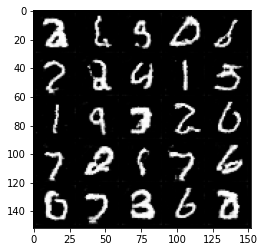

Real image


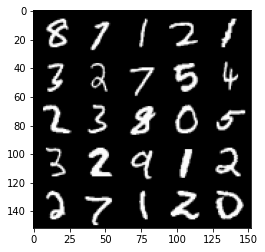

  0%|          | 0/469 [00:00<?, ?it/s]

Step 71500: Generator loss: 103.30948159155159, discriminator loss: 0.6933448721170424
Fake image


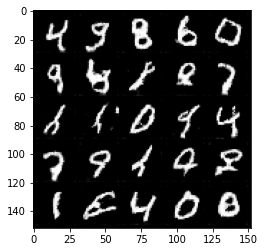

Real image


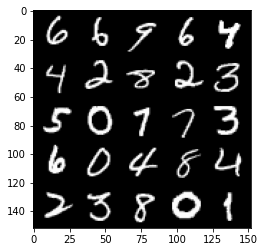

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72000: Generator loss: 104.0029914339475, discriminator loss: 0.6934256092309953
Fake image


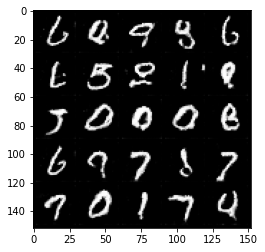

Real image


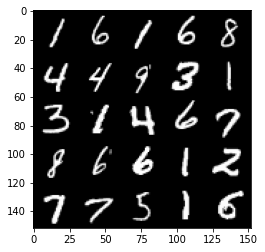

  0%|          | 0/469 [00:00<?, ?it/s]

Step 72500: Generator loss: 104.69642813572217, discriminator loss: 0.6934157381057734
Fake image


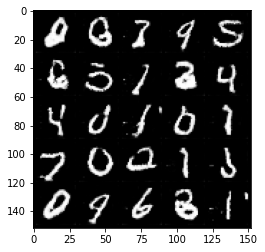

Real image


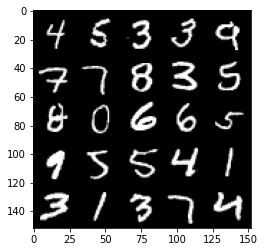

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73000: Generator loss: 105.38976712843699, discriminator loss: 0.693327378034592
Fake image


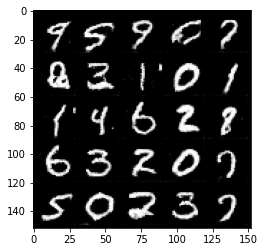

Real image


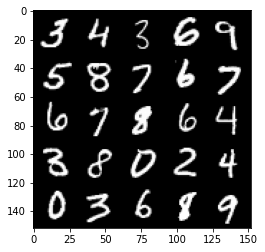

  0%|          | 0/469 [00:00<?, ?it/s]

Step 73500: Generator loss: 106.08316920110514, discriminator loss: 0.6933845398426058
Fake image


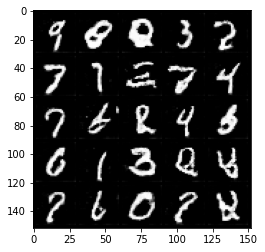

Real image


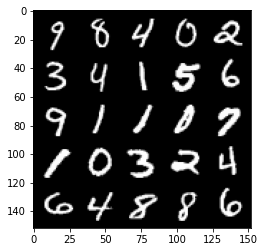

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74000: Generator loss: 106.7765993063144, discriminator loss: 0.6933343185186377
Fake image


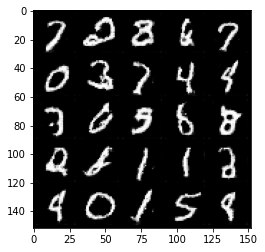

Real image


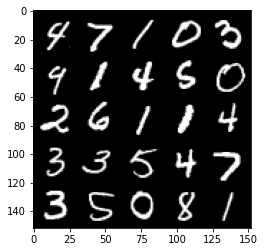

  0%|          | 0/469 [00:00<?, ?it/s]

Step 74500: Generator loss: 107.46987350675381, discriminator loss: 0.6933037422895432
Fake image


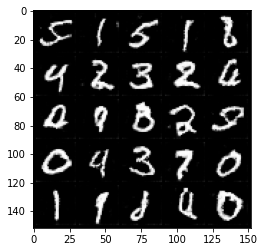

Real image


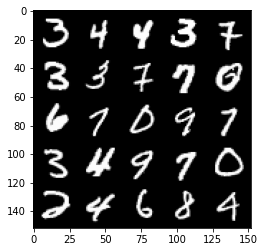

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75000: Generator loss: 108.16298106023594, discriminator loss: 0.693319966316223
Fake image


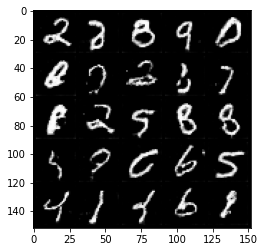

Real image


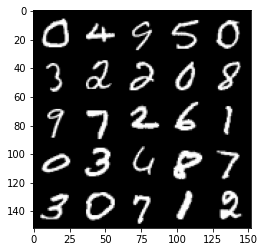

  0%|          | 0/469 [00:00<?, ?it/s]

Step 75500: Generator loss: 108.85638428291621, discriminator loss: 0.6932908300161363
Fake image


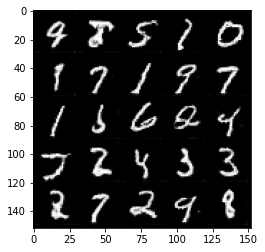

Real image


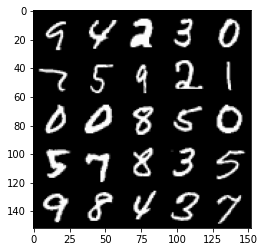

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76000: Generator loss: 109.54995951005766, discriminator loss: 0.6933505908250815
Fake image


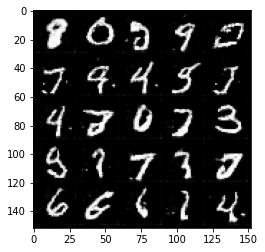

Real image


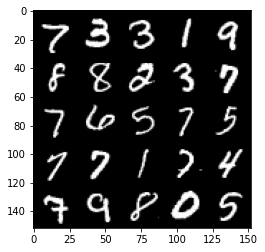

  0%|          | 0/469 [00:00<?, ?it/s]

Step 76500: Generator loss: 110.2432257678206, discriminator loss: 0.6932713652849193
Fake image


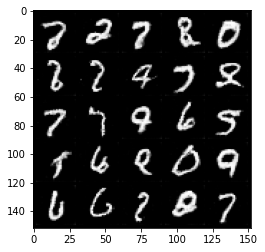

Real image


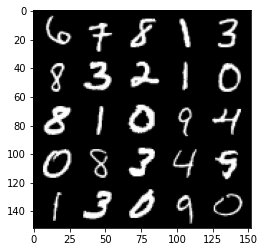

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77000: Generator loss: 110.93655436608157, discriminator loss: 0.6933182039260859
Fake image


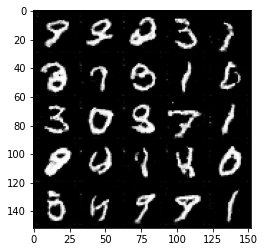

Real image


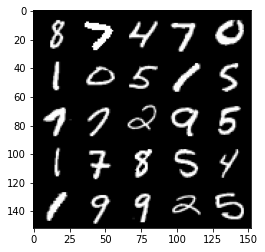

  0%|          | 0/469 [00:00<?, ?it/s]

Step 77500: Generator loss: 111.62988336214391, discriminator loss: 0.6933024435043335
Fake image


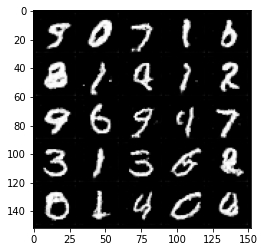

Real image


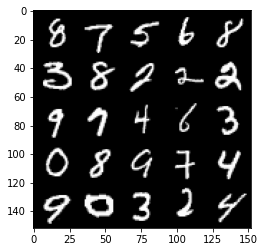

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78000: Generator loss: 112.32314447936385, discriminator loss: 0.6933428093194963
Fake image


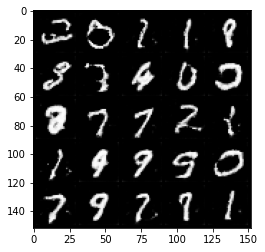

Real image


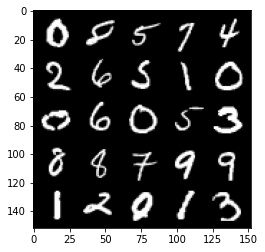

  0%|          | 0/469 [00:00<?, ?it/s]

Step 78500: Generator loss: 113.01659146854253, discriminator loss: 0.6932806258201598
Fake image


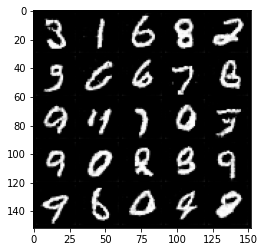

Real image


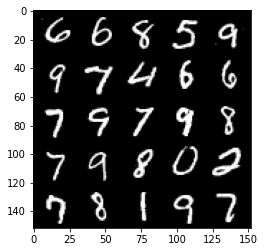

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79000: Generator loss: 113.7098711687025, discriminator loss: 0.6932788403034208
Fake image


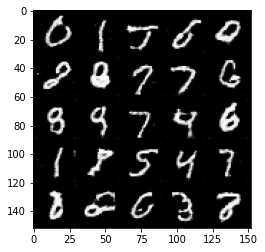

Real image


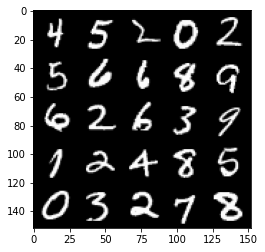

  0%|          | 0/469 [00:00<?, ?it/s]

Step 79500: Generator loss: 114.40300977084013, discriminator loss: 0.6932419499158854
Fake image


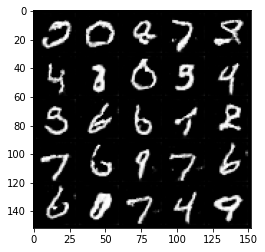

Real image


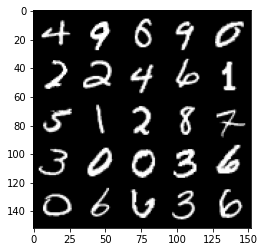

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80000: Generator loss: 115.09648854753341, discriminator loss: 0.6932789065837864
Fake image


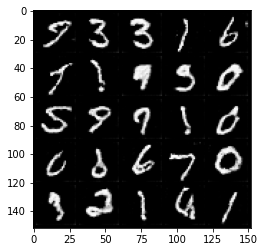

Real image


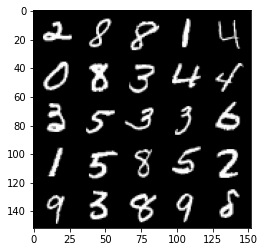

  0%|          | 0/469 [00:00<?, ?it/s]

Step 80500: Generator loss: 115.78986163303227, discriminator loss: 0.693233410954475
Fake image


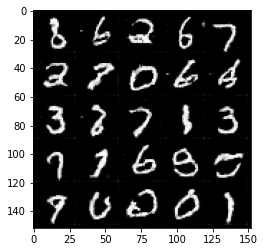

Real image


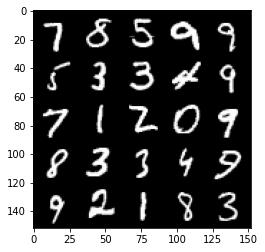

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81000: Generator loss: 116.48321399030064, discriminator loss: 0.6932537759542469
Fake image


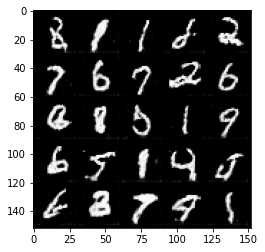

Real image


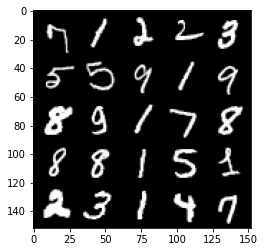

  0%|          | 0/469 [00:00<?, ?it/s]

Step 81500: Generator loss: 117.1763189153371, discriminator loss: 0.6932631094455727
Fake image


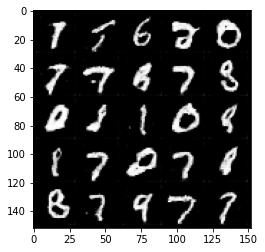

Real image


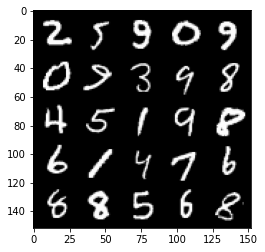

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82000: Generator loss: 117.87000772997706, discriminator loss: 0.6933166162967678
Fake image


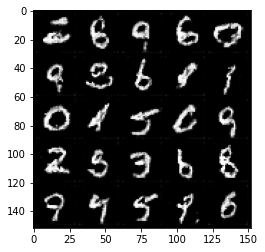

Real image


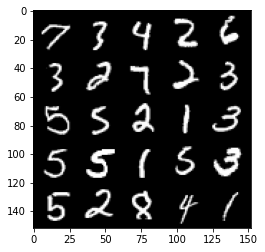

  0%|          | 0/469 [00:00<?, ?it/s]

Step 82500: Generator loss: 118.56332694169858, discriminator loss: 0.6932651686668393
Fake image


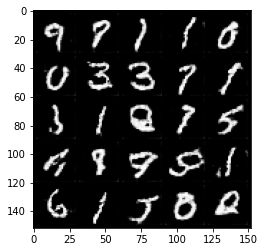

Real image


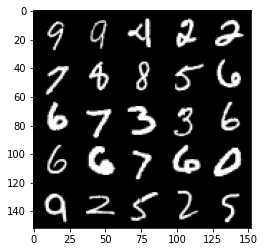

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83000: Generator loss: 119.25661660513242, discriminator loss: 0.6932454118728635
Fake image


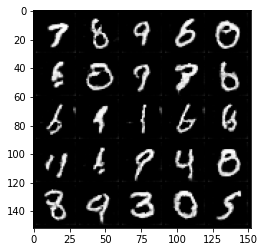

Real image


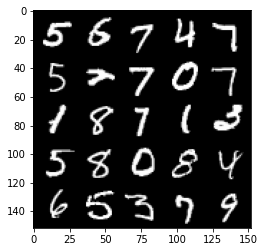

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 83500: Generator loss: 119.94998858746864, discriminator loss: 0.693273395776749
Fake image


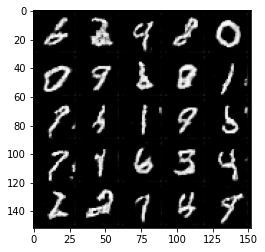

Real image


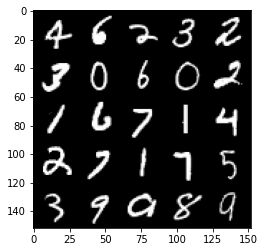

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84000: Generator loss: 120.64324428340778, discriminator loss: 0.6932813533544536
Fake image


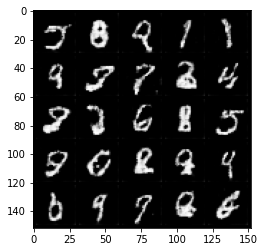

Real image


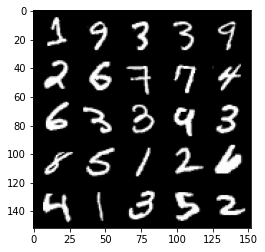

  0%|          | 0/469 [00:00<?, ?it/s]

Step 84500: Generator loss: 121.33647011169775, discriminator loss: 0.6932725404500957
Fake image


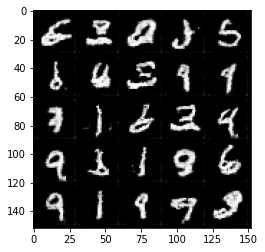

Real image


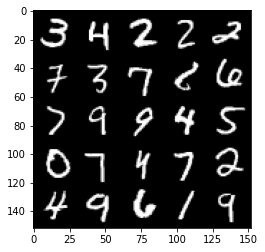

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85000: Generator loss: 122.02974734053002, discriminator loss: 0.6932208915948871
Fake image


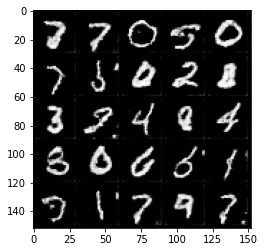

Real image


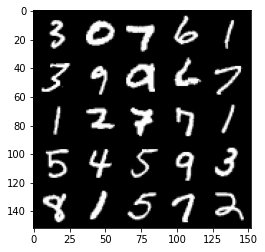

  0%|          | 0/469 [00:00<?, ?it/s]

Step 85500: Generator loss: 122.72300236102926, discriminator loss: 0.6932489606142045
Fake image


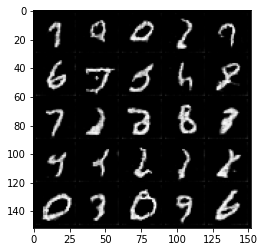

Real image


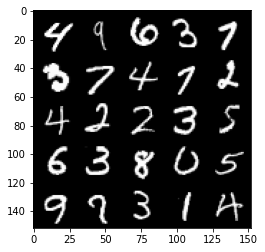

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86000: Generator loss: 123.41610957321492, discriminator loss: 0.6932197761535648
Fake image


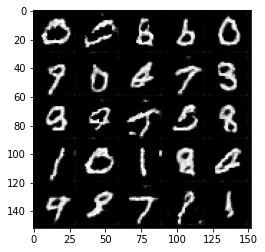

Real image


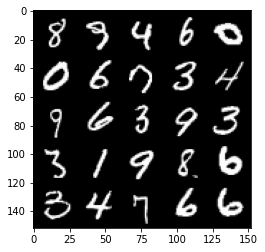

  0%|          | 0/469 [00:00<?, ?it/s]

Step 86500: Generator loss: 124.10952053174344, discriminator loss: 0.693258705377579
Fake image


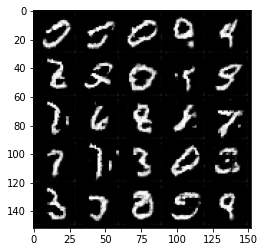

Real image


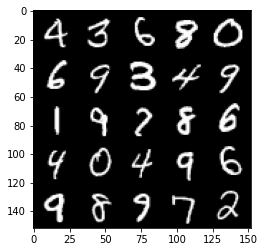

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87000: Generator loss: 124.80323508915271, discriminator loss: 0.6932857272624968
Fake image


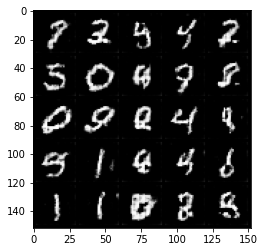

Real image


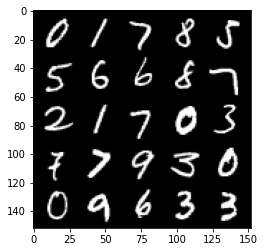

  0%|          | 0/469 [00:00<?, ?it/s]

Step 87500: Generator loss: 125.49646436139905, discriminator loss: 0.6932733584642408
Fake image


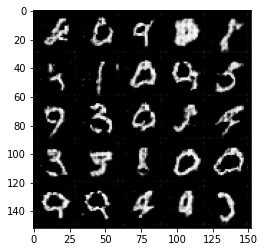

Real image


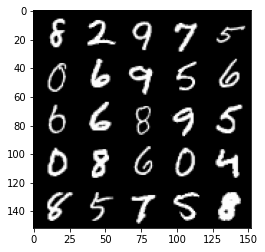

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88000: Generator loss: 126.18962795695614, discriminator loss: 0.6932756940126422
Fake image


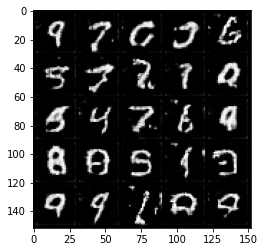

Real image


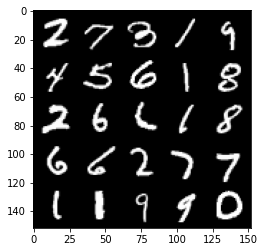

  0%|          | 0/469 [00:00<?, ?it/s]

Step 88500: Generator loss: 126.88283191809016, discriminator loss: 0.693212496876717
Fake image


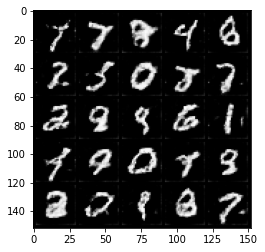

Real image


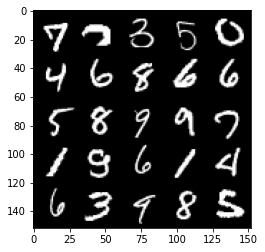

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89000: Generator loss: 127.57617684206315, discriminator loss: 0.6932526638507835
Fake image


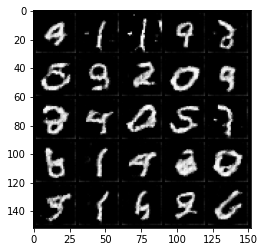

Real image


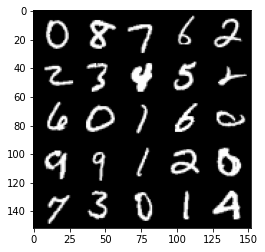

  0%|          | 0/469 [00:00<?, ?it/s]

Step 89500: Generator loss: 128.26931780275666, discriminator loss: 0.6932625769376748
Fake image


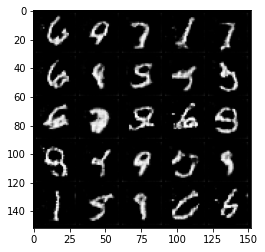

Real image


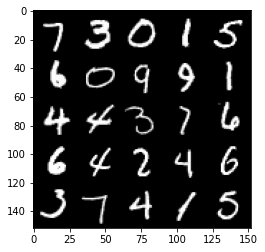

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90000: Generator loss: 128.96253410538995, discriminator loss: 0.6932118567228311
Fake image


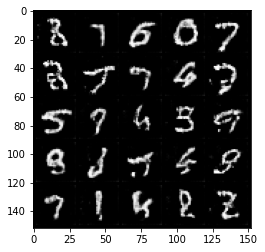

Real image


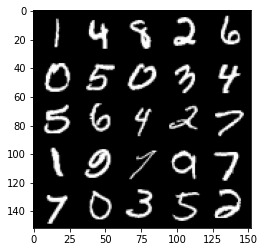

  0%|          | 0/469 [00:00<?, ?it/s]

Step 90500: Generator loss: 129.65580935379822, discriminator loss: 0.6932408968210226
Fake image


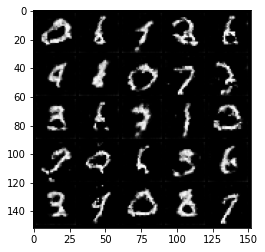

Real image


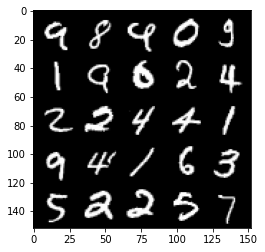

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91000: Generator loss: 130.34918022403056, discriminator loss: 0.693226660013198
Fake image


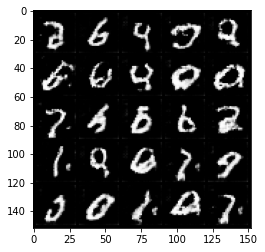

Real image


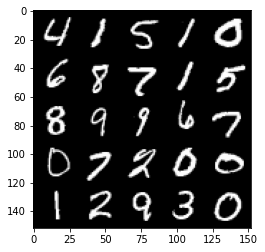

  0%|          | 0/469 [00:00<?, ?it/s]

Step 91500: Generator loss: 131.04262841054685, discriminator loss: 0.693279459476471
Fake image


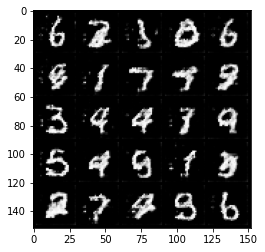

Real image


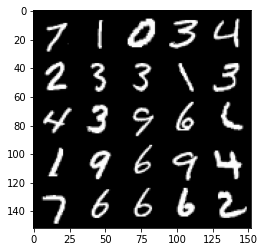

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92000: Generator loss: 131.73603620704887, discriminator loss: 0.6933216401338587
Fake image


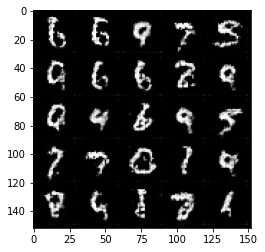

Real image


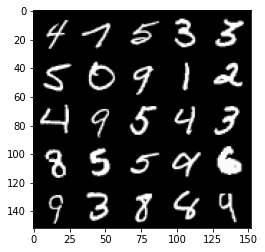

  0%|          | 0/469 [00:00<?, ?it/s]

Step 92500: Generator loss: 132.42945797678718, discriminator loss: 0.6932256329059602
Fake image


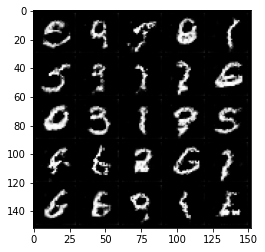

Real image


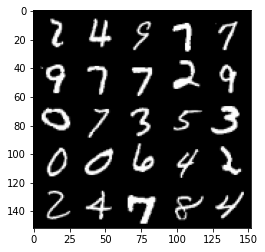

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93000: Generator loss: 133.12288476869347, discriminator loss: 0.6932468206882474
Fake image


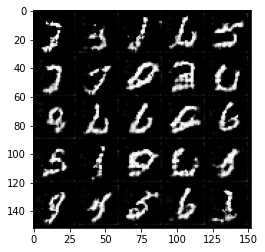

Real image


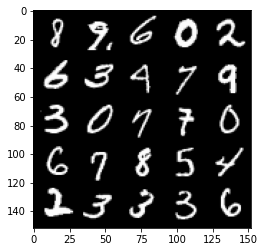

  0%|          | 0/469 [00:00<?, ?it/s]

Step 93500: Generator loss: 133.81615126392117, discriminator loss: 0.6932759674787528
Fake image


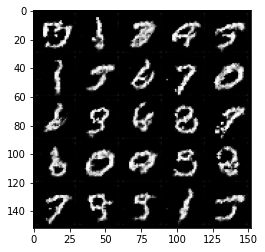

Real image


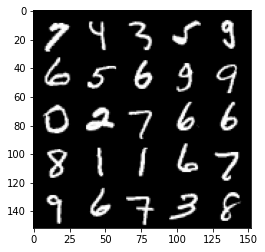

In [11]:
n_epochs = 200
cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
for epoch in range(n_epochs):
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        ## Update discriminator ##
        disc_opt.zero_grad()
        fake_noise = get_noise(cur_batch_size, z_dim, device=device)
        fake = gen(fake_noise)
        disc_fake_pred = disc(fake.detach())
        disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
        disc_real_pred = disc(real)
        disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
        disc_loss = (disc_fake_loss + disc_real_loss) / 2

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step
        # Update gradients
        disc_loss.backward(retain_graph=True)
        # Update optimizer
        disc_opt.step()

        ## Update generator ##
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        disc_fake_pred = disc(fake_2)
        gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
        gen_loss.backward()
        gen_opt.step()

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ## Visualization code ##
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            print('Fake image')
            show_tensor_images(fake)
            print('Real image')
            show_tensor_images(real)
            mean_discriminator_loss = 0
        cur_step += 1

